## Grupo 5 - Entrega

---

In [236]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import descartes
import seaborn as sns
import plotly.express as px
import re
import matplotlib.pyplot as plt

In [237]:
# El primer paso es importar el archivo con el cual vamos a trabajar
df= pd.read_csv('properatti.csv')

In [238]:
# Observamos las columnas que componen nuestro DataFrame

df_columns=list(df.columns)
print(df_columns)
df.shape

['Unnamed: 0', 'operation', 'property_type', 'place_name', 'place_with_parent_names', 'country_name', 'state_name', 'geonames_id', 'lat-lon', 'lat', 'lon', 'price', 'currency', 'price_aprox_local_currency', 'price_aprox_usd', 'surface_total_in_m2', 'surface_covered_in_m2', 'price_usd_per_m2', 'price_per_m2', 'floor', 'rooms', 'expenses', 'properati_url', 'description', 'title', 'image_thumbnail']


(121220, 26)

In [239]:
# Observamos qué tipos de columnas forman el dataframe

df_types= df.dtypes
df_types.value_counts()

float64    13
object     12
int64       1
dtype: int64

In [240]:
# Deseamos conocer el porcentaje de nulos por columna

porcentaje_nulos_por_columna= (pd.isna(df).sum()/len(df))*100
round(porcentaje_nulos_por_columna.sort_values(ascending=False),2)

floor                         93.48
expenses                      88.23
rooms                         60.91
price_usd_per_m2              43.39
lon                           42.53
lat-lon                       42.53
lat                           42.53
surface_total_in_m2           32.44
price_per_m2                  27.69
currency                      16.84
price_aprox_usd               16.84
price_aprox_local_currency    16.84
price                         16.84
surface_covered_in_m2         16.42
geonames_id                   15.44
image_thumbnail                2.57
place_name                     0.02
description                    0.00
title                          0.00
properati_url                  0.00
state_name                     0.00
country_name                   0.00
place_with_parent_names        0.00
property_type                  0.00
operation                      0.00
Unnamed: 0                     0.00
dtype: float64

In [241]:
"""
Veo que la primera columna "Unnamed: O" coincide con el índice. 
El siguiente paso es verificar si la cantidad de coincidencias del indice
con esta columna es igual a la cantidad de registros que contiene el DataFrame (121220),
en caso de ser positivo, se puede eliminar la columna UNNAMED, en caso contrario
se debe usar el indice y no debemos eliminar la columna UNNAMED. 

"""
(df.index== df['Unnamed: 0']).sum()

121220

In [242]:
# Vemos que son iguales, por lo cual podemos eliminar la columna del DataFrame

df= df.drop(['Unnamed: 0'], axis= 1)
df.sample(2)

,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,lon,...,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
94548,sell,apartment,Valeria del Mar,|Argentina|Buenos Aires Costa Atlántica|Valeri...,Argentina,Buenos Aires Costa Atlántica,3427561.0,NaN,NaN,NaN,...,28.0,1964.285714,1964.285714,NaN,NaN,NaN,http://www.properati.com.ar/1bfq4_venta_depart...,"Complejo de 5 deptos en Primer Piso, y en Plan...",Departamento en Valeria Del Mar,https://thumbs4.properati.com/7/DStqBg50pVOiV5...
2025,sell,house,Los Pingüinos Country Club,|Argentina|Bs.As. G.B.A. Zona Oeste|Ituzaingó|...,Argentina,Bs.As. G.B.A. Zona Oeste,NaN,"-34.61661148,-58.68174362",-34.616611,-58.681744,...,200.0,NaN,NaN,NaN,5.0,NaN,http://www.properati.com.ar/15jq2_venta_casa_l...,"FM 2578/6Living en desnivel y comedor, cocina ...",U$D 550.000 - Casa en Venta - Udaondo 3000,https://thumbs4.properati.com/8/7Wn0Kdc6LuM65c...


In [243]:
# Revisamos el porcentaje de propiedades que hay en cada región.

state_name_mix = (df["state_name"].value_counts()/len(df)).reset_index()
state_name_mix['state_name'] = (state_name_mix['state_name']*100).round(1) 
state_name_mix.columns = ['state_name', 'mix']
state_name_mix

,state_name,mix
0,Capital Federal,26.7
1,Bs.As. G.B.A. Zona Norte,21.1
2,Bs.As. G.B.A. Zona Sur,11.5
3,Córdoba,10.0
4,Santa Fe,8.4
5,Buenos Aires Costa Atlántica,8.3
6,Bs.As. G.B.A. Zona Oeste,7.7
7,Buenos Aires Interior,1.9
8,Río Negro,0.7
9,Neuquén,0.6


In [244]:
# Graficamos la cantidad de propiedades por provincia

fig = px.bar(data_frame = state_name_mix[state_name_mix["mix"] >1.8], x='state_name' , y='mix', text='mix' , width=500, height=500)

fig.update_layout(
    title='<b>Propiedades por Provincia</b>',
    xaxis_tickfont_size=10,
    yaxis=dict(title='% del total',titlefont_size=14,tickfont_size=10),
    title_x=0.5)
fig.update_traces(textposition='inside', textangle = 0, insidetextanchor='middle')

fig.show()

In [245]:
# Revisamos el porcentaje de propiedades que hay por tipo.

property_type_mix = (df["property_type"].value_counts()/len(df)).reset_index()
property_type_mix['property_type'] = (property_type_mix['property_type']*100).round(1)
property_type_mix.columns = ['property_type', 'mix']
property_type_mix

,property_type,mix
0,apartment,58.6
1,house,33.2
2,PH,4.7
3,store,3.4


In [246]:
# Graficamos el porcentaje por tipo de propiedad que hay en el DataFrame

fig = px.bar(data_frame= property_type_mix, x='property_type' , y='mix', text = 'mix'  , width=500, height=500)

fig.update_layout(
    title='<b>Propiedades por Tipo</b>',
    xaxis_tickfont_size=10,
    yaxis=dict(title='% del total',titlefont_size=14,tickfont_size=10),
    title_x=0.5)
fig.update_traces(textposition='inside', textangle = 0, insidetextanchor='middle')
fig.show()

In [247]:
# Vemos que todos los registros corresponden a ventas, por lo cual decidimos eliminar la columna operation

df["operation"].value_counts()

sell    121220
Name: operation, dtype: int64

In [248]:
#Borro la columna "operation" porque todas son ventas.
df = df.drop(["operation"], axis=1)

In [249]:
# Drop column "lat-lon" porque es repetitiva
df = df.drop(["lat-lon"], axis=1)

In [250]:
# Ahora vamos a analizar por medio de Geopandas algunos datos. Para esto creamos un nuevo DataFrame

geo_df = gpd.GeoDataFrame(df,geometry=gpd.points_from_xy(df['lon'], df['lat']))
geo_df.columns

Index(['property_type', 'place_name', 'place_with_parent_names',
       'country_name', 'state_name', 'geonames_id', 'lat', 'lon', 'price',
       'currency', 'price_aprox_local_currency', 'price_aprox_usd',
       'surface_total_in_m2', 'surface_covered_in_m2', 'price_usd_per_m2',
       'price_per_m2', 'floor', 'rooms', 'expenses', 'properati_url',
       'description', 'title', 'image_thumbnail', 'geometry'],
      dtype='object')

In [251]:
# Las columnas mas relevantes para geopandas son las siguientes:

geo_df.loc[:4,['geometry', 'lon', 'lat','place_name']]

,geometry,lon,lat,place_name
0,POINT (-58.50884 -34.66182),-58.508839,-34.661824,Mataderos
1,POINT (-57.96433 -34.90388),-57.964330,-34.903883,La Plata
2,POINT (-58.52298 -34.65226),-58.522982,-34.652262,Mataderos
3,POINT (-58.51642 -34.64780),-58.516424,-34.647797,Liniers
4,POINT (-57.54945 -38.00263),-57.549447,-38.002626,Centro


In [252]:
# Vamos a graficar los propiedades publicadas en el mapa de Argentina, pero antes, debemos saber que no todas las propiedades
# cuentan con la longitud y la latitud, por lo cual, el gráfico solo va a contener algunas propiedades
# observemos esto:

print(geo_df.lon.isnull().sum())
print(geo_df.lat.isnull().sum())

51550
51550


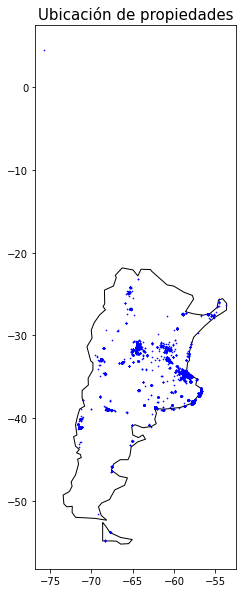

In [253]:
# Vamos a graficar las propiedades en el mapa de Argentina.
# Hay un outlier que corresponde a una propiedad de Colombia


world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
ax = world[world.name == 'Argentina'].plot(color='white', edgecolor='black', figsize = (20,10))

ax.set_title("Ubicación de propiedades",fontdict={"fontsize":15})

# Sobre las ciudades superpone el mapa del país

geo_df.plot(ax=ax, color='blue', markersize= 0.40 )


plt.show()

In [254]:
# Evaluamos estar trabajando con el mismo sistema de coordenadas.

world.crs

{'init': 'epsg:4326'}

In [255]:
# Vamos a encontrar la propiedad que no pertenece a Argentina. Para esto vamos a utilizar puntos extremos continentales
# de la Argentina, que nos permitan filtrar datos. Encontramos lo siguiente:

# Norte: Confluencia de los ríos Grande de San Juan y Mojinete, Provincia de Jujuy (Latitud 21º 46' 52" S; Longitud 66º 13' 17" O).
# Oeste: Punto ubicado en el Parque Nacional Los Glaciares, Provincia de Santa Cruz (Latitud 50º 01’ S; Longitud 73º 34' O).


mask_lat_no_arg= geo_df['lat']>-22
geo_df_lat_no_arg= geo_df[mask_lat_no_arg]
geo_df_lat_no_arg

,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat,lon,price,currency,...,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,geometry
9761,house,Córdoba,|Argentina|Córdoba|,Argentina,Córdoba,3860255.0,4.545843,-75.678931,0.0,NaN,...,NaN,NaN,2.0,3.0,NaN,http://www.properati.com.ar/165i3_venta_casa_c...,Casa en Venta de 2 dorm. en Armenia,SE VENDE CASA EN EL BARRIO EL LIMONAR,https://thumbs4.properati.com/2/2huBKPZv0RyWda...,POINT (-75.67893 4.54584)


In [256]:
# Exportamos estos datos para utilizarlos posteriormente en un mapa dinamico

df.to_csv('df.csv')

In [257]:
# Sacamos el outlier a nivel país. Es util recordar cuantas filas nulas tiene la columna lat
print(df['lat'].isnull().sum())

# Vemos a su vez, cuantas filas con datos correctos tiene el geo_df
print(len(df)- 51550)

51550
69670


In [258]:
# Creamos un nuevo DataFrame, el cual se encuentra sin outliers, y contiene las coordenadas de las propiedades ubicadas en Argentina

mask_arg= df['lat'] < -22
df_arg= df.loc[mask_arg, :]
len(df_arg)

69669

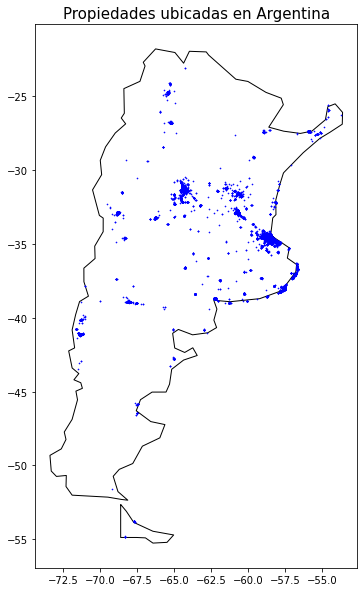

In [259]:
# Finalmente, graficamos nuevamente las propiedades ubicadas en Argentina sin este outlier

geo_df_arg = gpd.GeoDataFrame(df_arg,geometry=gpd.points_from_xy(df_arg['lon'], df_arg['lat']))
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
ax = world[world.name == 'Argentina'].plot(color='white', edgecolor='black', figsize = (20,10))

ax.set_title("Propiedades ubicadas en Argentina",fontdict={"fontsize":15})

# Sobre las ciudades superpone el mapa del país

geo_df_arg.plot(ax=ax, color='blue', markersize= 0.40 )

plt.show()

In [260]:
# Exportamos el df_arg para graficarlo en mapbox 

df.to_csv('df_arg.csv')

In [369]:
# Porcentaje de registros con longitud y latitud

print("El porcentaje de registros con latitud y longitud es de:",((df["lat"].notnull().sum()/df.shape[0])*100).round(2), "%")

El porcentaje de registros con latitud y longitud es de: 57.74 %


In [261]:
#Antes de hacer el count de abajo, quiero, en esta línea, dejar sólo los registros iguales a:
state_name_list_ok = ["Capital Federal",
"Bs.As. G.B.A. Zona Norte",
"Bs.As. G.B.A. Zona Sur",
"Córdoba",
"Santa Fe",
"Buenos Aires Costa Atlántica",
"Bs.As. G.B.A. Zona Oeste",
"Buenos Aires Interior"]

In [376]:
df_8_state_names = df_arg.loc[df_arg["state_name"].isin(state_name_list_ok),:]

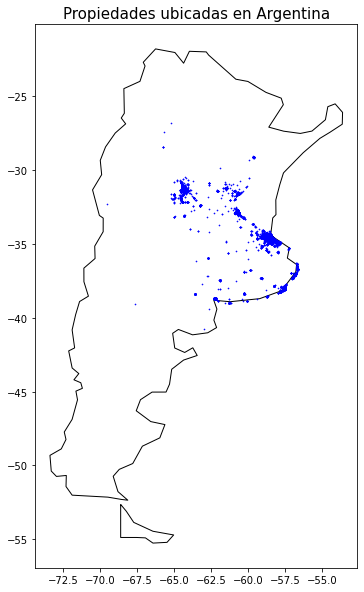

In [378]:
# Finalmente, graficamos nuevamente las propiedades ubicadas en Argentina de los 8 state names principales

geo_df_arg = gpd.GeoDataFrame(df_8_state_names,geometry=gpd.points_from_xy(df_8_state_names['lon'], df_8_state_names['lat']))
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
ax = world[world.name == 'Argentina'].plot(color='white', edgecolor='black', figsize = (20,10))

ax.set_title("Propiedades ubicadas en Argentina",fontdict={"fontsize":15})

# Sobre las ciudades superpone el mapa del país

geo_df_arg.plot(ax=ax, color='blue', markersize= 0.40 )

plt.show()

In [262]:
# Cantidad de registros sin la segmentación por state_name;
df.shape

(121220, 24)

In [263]:
# Seteamos como index, los valores de state_name;
df = df.set_index("state_name")

In [264]:
# Cantidad de registros luego de la segmentación por state_name;
df.loc[state_name_list_ok, :].shape

(115688, 23)

In [265]:
# df con los datos de los 8 state_name más importantes.
df = df.loc[state_name_list_ok, :]

In [266]:
# Comenzamos a trabajar con la columna "floor" a continuación, para ver si la podemso salvar;

In [267]:
#Vemos la cantidad de no nulos en la columna floor para todos los datos.
df.loc[df["floor"].notnull()].describe()

,geonames_id,lat,lon,price,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses
count,6.812000e+03,5905.000000,5905.000000,6.795000e+03,6.795000e+03,6.795000e+03,3595.000000,6898.000000,3208.000000,6349.000000,7615.000000,5441.000000,1027.000000
mean,3.635403e+06,-33.928174,-59.683618,3.527507e+05,3.972866e+06,2.251617e+05,81.444228,99.895332,2340.929008,5552.724733,17.403152,2.647307,2522.842259
std,5.406267e+05,1.488243,2.270634,6.354222e+05,5.359711e+06,3.037610e+05,245.697695,325.831184,868.641196,16628.236710,116.985284,1.271013,2481.155954
min,3.427326e+06,-38.583214,-75.678931,0.000000e+00,0.000000e+00,0.000000e+00,10.000000,1.000000,29.906933,7.462100,1.000000,1.000000,1.000000
25%,3.429651e+06,-34.618785,-60.639286,1.020000e+05,1.623294e+06,9.200000e+04,45.000000,44.000000,1857.142857,1888.888889,1.000000,2.000000,1200.000000
50%,3.433955e+06,-34.589013,-58.478612,1.500000e+05,2.434941e+06,1.380000e+05,60.000000,60.000000,2239.436620,2418.604651,3.000000,3.000000,1800.000000
75%,3.838574e+06,-32.957491,-58.423104,2.710000e+05,3.970012e+06,2.250000e+05,84.000000,93.000000,2787.656423,3237.288136,6.000000,3.000000,2869.000000
max,6.942539e+06,4.545843,-56.674305,1.168104e+07,6.881355e+07,3.900000e+06,9563.000000,12731.000000,19800.000000,692046.000000,2509.000000,22.000000,19000.000000


In [268]:
#Cantidad de datos no nulos en floor.
df["floor"].count()

7615

In [269]:
# Buscamos el dato del edificio más grande de arg que tiene 54 pisos y calculamos la cantidad de registros por encima de este umbral;
df["floor"][df["floor"] > 54].count()

180

In [270]:
# Reseteamos el index del df original para poder limpiarlo;
df.reset_index(inplace=True)

In [271]:
# Guardamos en una variable el index de todos los que son mayores a 54.
indices_mayor_54_floor = df[df["floor"] > 54].index.tolist()

In [272]:
# Imputamos los datos mayores a 54 de la columna floor por apartment con NAN.
df["floor"].where(df["floor"] < 54, np.NAN, inplace=True)

In [273]:
# Verificamos que los 180 registros que tenían datos erróneos en la columna floor, fueron reemplazados por NAN.
df[df.index.isin(indices_mayor_54_floor)].head(1)

,state_name,property_type,place_name,place_with_parent_names,country_name,geonames_id,lat,lon,price,currency,...,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,geometry
984,Capital Federal,apartment,Villa Urquiza,|Argentina|Capital Federal|Villa Urquiza|,Argentina,3433775.0,-34.56633,-58.479707,175000.0,USD,...,NaN,2692.307692,NaN,2.0,NaN,http://www.properati.com.ar/15ro1_venta_depart...,Corredor Responsable: Rebeca Stern - C.U.C.I.C...,2 AMB BALCÓN CON PARRILLA - EDIFICIO CON AMENI...,https://thumbs4.properati.com/2/pKvgfBNKpAZctY...,POINT (-58.47971 -34.56633)


In [274]:
# Pensamos en imputar los datos que son casas con valores de 0, porque tienen piso cero, de ahí empezamos a hacer el siguiente análisis:

# Contamos la cantidad de registros que son casas.
df_house = df.loc[df["property_type"] == "house"]

pd.DataFrame(df_house)

,state_name,property_type,place_name,place_with_parent_names,country_name,geonames_id,lat,lon,price,currency,...,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail,geometry
13,Capital Federal,house,Puerto Madero,|Argentina|Capital Federal|Puerto Madero|,Argentina,3429760.0,-34.617719,-58.362056,70000.0,USD,...,875.000000,1400.000000,NaN,NaN,NaN,http://www.properati.com.ar/15bu1_venta_casa_p...,ESTRUCTURA ECOLOGICA FLOTANTEIDEAL PARA UBICAR...,FLOAT LIFE - CASA FLOTANTE - UBICABLE EN CLUBS...,https://thumbs4.properati.com/5/UvWlBF2qAapN1p...,POINT (-58.362 -34.618)
15,Capital Federal,house,Boedo,|Argentina|Capital Federal|Boedo|,Argentina,3436003.0,-34.636321,-58.410702,550000.0,USD,...,1091.269841,1697.530864,NaN,NaN,NaN,http://www.properati.com.ar/15bui_venta_casa_b...,Se encuentra dentro del Distrito Tecnológico. ...,Casa impecable refaccionada! 6 ambientes.,https://thumbs4.properati.com/4/bcATdI9jz_52YM...,POINT (-58.411 -34.636)
26,Capital Federal,house,Capital Federal,|Argentina|Capital Federal|,Argentina,3433955.0,NaN,NaN,170000.0,USD,...,944.444444,1030.303030,NaN,NaN,NaN,http://www.properati.com.ar/15d29_venta_casa_b...,"Casa en 2 Plantas en BÂ° La Merced, a Metros d...","Casa 180m² con 2 Plantas en Navarro, Julián 29...",https://thumbs4.properati.com/4/0oBb4XqxRngzR8...,POINT (nan nan)
27,Capital Federal,house,Capital Federal,|Argentina|Capital Federal|,Argentina,3433955.0,NaN,NaN,490000.0,USD,...,658.602151,1400.000000,NaN,NaN,NaN,http://www.properati.com.ar/15d2j_venta_casa_b...,"Lote: 744,76 m. (Frente: 17,32 x 43 de fondo) ...",Casa 744m² con 2 Plantas en Del Valle Iberluce...,https://thumbs4.properati.com/8/18ePTaTJyu0_Zz...,POINT (nan nan)
28,Capital Federal,house,Capital Federal,|Argentina|Capital Federal|,Argentina,3433955.0,NaN,NaN,440000.0,USD,...,611.111111,1685.823755,NaN,NaN,NaN,http://www.properati.com.ar/15d2z_venta_casa_b...,PB. Liv y com con chimenea con salida a jardin...,"Casa 720m² con Plantas en Palma, Diego 1800, A...",https://thumbs4.properati.com/5/QFONCBUzvOiyBI...,POINT (nan nan)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115678,Buenos Aires Interior,house,Tandil,|Argentina|Buenos Aires Interior|Tandil|,Argentina,3427832.0,-37.313734,-59.100573,200000.0,USD,...,400.801603,1282.051282,NaN,5.0,NaN,http://www.properati.com.ar/1chi4_venta_casa_t...,"Casa con 4 dormitorios. Living, Cocina, Comedo...",Casa venta,https://thumbs4.properati.com/1/xeJ98B9dlpj60l...,POINT (-59.101 -37.314)
115680,Buenos Aires Interior,house,Bahía Blanca,|Argentina|Buenos Aires Interior|Bahía Blanca|,Argentina,3865084.0,-38.730753,-62.277651,1000000.0,ARS,...,747.782267,14285.714286,NaN,4.0,NaN,http://www.properati.com.ar/1chl9_venta_casa_b...,Casa al frente en PH compuesta de 2 dormitorio...,Oportunidad Donado 1100,https://thumbs4.properati.com/1/WP1ddrCFaRmtCe...,POINT (-62.278 -38.731)
115684,Buenos Aires Interior,house,Sierra de los Padres,|Argentina|Buenos Aires Interior|General Pueyr...,Argentina,3427958.0,NaN,NaN,210000.0,USD,...,172.839506,840.000000,NaN,5.0,NaN,http://www.properati.com.ar/1chm5_venta_casa_s...,Chalet 5 Ambientes sobre 2 lotes de 600mts c/u...,Sierras de los Padres,https://thumbs4.properati.com/7/cb6G0i2oVWoRUq...,POINT (nan nan)
115686,Buenos Aires Interior,house,Balcarce,|Argentina|Buenos Aires Interior|Balcarce|,Argentina,3436176.0,-37.837561,-58.259803,75000.0,USD,...,192.307692,555.555556,NaN,4.0,NaN,http://www.properati.com.ar/1chn6_venta_casa_b...,"Lote de 13x30, 2 habitaciones, living comedor ...",Casa+ Depto monoambiente,https://thumbs4.properati.com/8/z0_P_KangoJQSr...,POINT (-58.260 -37.838)


In [275]:
# Imputamos todos los registros de casas para que tengan, en floor, valor 0 (cero);
df.loc[df["property_type"]=="house","floor"] = 0

In [276]:
# Verificamos que haya cambiado todos los valores a cero del paso anterior.
df.loc[df["property_type"]=="house", "floor"].head(1)

13    0.0
Name: floor, dtype: float64

In [277]:
# Vemos que luego de la imputación, bajó considerablemente la cantidad de nulos de la columna floor, al principio eran 113316 registros;
df.isnull().sum()

state_name                         0
property_type                      0
place_name                        23
place_with_parent_names            0
country_name                       0
geonames_id                    18527
lat                            48639
lon                            48639
price                          17870
currency                       17871
price_aprox_local_currency     17870
price_aprox_usd                17870
surface_total_in_m2            37058
surface_covered_in_m2          17744
price_usd_per_m2               49058
price_per_m2                   30175
floor                          71426
rooms                          69989
expenses                      101758
properati_url                      0
description                        2
title                              0
image_thumbnail                 2848
geometry                           0
dtype: int64

In [278]:
# Deseamos conocer el porcentaje de nulos por columna, vemos que el porcentaje de floor bajó considerablemente, al principio estaba en 93.48%;
porcentaje_nulos_por_columna= (pd.isna(df).sum()/len(df))*100
round(porcentaje_nulos_por_columna.sort_values(ascending=False),2)

expenses                      87.96
floor                         61.74
rooms                         60.50
price_usd_per_m2              42.41
lat                           42.04
lon                           42.04
surface_total_in_m2           32.03
price_per_m2                  26.08
geonames_id                   16.01
currency                      15.45
price_aprox_local_currency    15.45
price                         15.45
price_aprox_usd               15.45
surface_covered_in_m2         15.34
image_thumbnail                2.46
place_name                     0.02
description                    0.00
place_with_parent_names        0.00
property_type                  0.00
geometry                       0.00
country_name                   0.00
properati_url                  0.00
title                          0.00
state_name                     0.00
dtype: float64

In [279]:
# Total de datos no nulos y diferentes a cero, filtrados por apartment; Apartment es el tipo de propiedad que más datos tiene, si no tiene potencial de imputación porque tiene pocos datos nulos, eliminamos la columna floor;
dptos_dif_nan_y_cero = df.loc[(df["floor"] != 0) & (~np.isnan(df["floor"]))& (df["property_type"] == "apartment"), :].shape

print(f"Total de datos diferentes a NaN y diferentes a cero: {dptos_dif_nan_y_cero}")

Total de datos diferentes a NaN y diferentes a cero: (6158, 24)


In [280]:
# Cantidad total de registros de dptos en el dataset.
dptos_all_shape = df.loc[df["property_type"] == "apartment"].shape

In [281]:
# Porcentaje de registros de dptos en todo el dataset con valores distintos de cero y distintos de NaN, respecto al total de registros de dptos.
proporcion_dptos_not_nan_ni_cero_all_dptos = dptos_dif_nan_y_cero[0] / dptos_all_shape[0] * 100

print(f"Relación dptos not null ni cero respecto a total dptos: {np.round(proporcion_dptos_not_nan_ni_cero_all_dptos,3)} %") 

Relación dptos not null ni cero respecto a total dptos: 8.958 %


Decisión final sobre la columna "floor": Eliminación.

Motivo: La proporción de departamentos que no tienen valores cero ni NaN, respecto del total es demasiado baja para tomar decisiones al respecto, por el momento, decidimos eliminarla;

In [282]:
# drop columna floor respecto a la conclusión de arriba;
df = df.drop(["floor"], axis=1) 
#--> Lo comentamos porque ya lo dropeamos y devuelve error;

In [283]:
# drop columna expenses por faltante de datos, no creemos que vaya a sumar al modelo;
df = df.drop(["expenses"], axis=1);  
# --> Lo comentamos porque ya lo dropeamos y devuelve error.

In [284]:
# drop de currency porque todas tienen la misma moneda.
df = df.drop(["currency"], axis=1)

## Segunda etapa de limpieza

<p>A este punto nos damos cuenta que tenemos que empezar a limpiar las columnas surface_covered_in_m2, surface_total_in_m2, y todas las columnas que tengan una íntima relación en la definición del valor de price_usd_per_m2;</p>

In [285]:
# Filtro el dataset para que me muestre solo las columnas sobre precios y m2, sumamos la property_type y state_name para poder segmentar por estas también.
# En este punto, creamos el df df_price_and_m2, y toda modificaicón que realizamos en él, lo vamos plasmando también en el df original con nombre df;
df_price_and_m2 = df.loc[:,["price_usd_per_m2", "surface_total_in_m2", "price_aprox_usd", "price", "surface_covered_in_m2", "price_aprox_local_currency", "property_type", "state_name"]]

df_price_and_m2.head(1)

,price_usd_per_m2,surface_total_in_m2,price_aprox_usd,price,surface_covered_in_m2,price_aprox_local_currency,property_type,state_name
0,1127.272727,55.0,62000.0,62000.0,40.0,1093959.0,PH,Capital Federal


In [286]:
#Cantidad total de registros;
df_price_and_m2.shape[0]

115688

In [287]:
# Proporción de nulls por columna según total de registros;
(df_price_and_m2.isnull().sum() / df_price_and_m2.shape[0] * 100).sort_values(ascending = False)

price_usd_per_m2              42.405435
surface_total_in_m2           32.032709
price_aprox_local_currency    15.446719
price                         15.446719
price_aprox_usd               15.446719
surface_covered_in_m2         15.337805
state_name                     0.000000
property_type                  0.000000
dtype: float64

In [288]:
#Guardo los índices de price_aprox_usd que son null en una lista;
index_price_aprox_usd_null = df_price_and_m2[df_price_and_m2["price_aprox_usd"].isnull()].index.tolist()

# Ahora rescato los indices de price_aprox_local_currency que son null;
index_price_aprox_local_currency_null = df_price_and_m2[df_price_and_m2["price_aprox_local_currency"].isnull()].index.tolist()

# Comparo las dos listas de índices de index_price_aprox_local_currency_null y index_price_aprox_usd_null para ver si son los mismso índices;
index_price_aprox_usd_null == index_price_aprox_local_currency_null

True

### Resolución:

<p>En un principio vimos que las columnas price_aprox_usd y price_aprox_local_currency presentaban la misma proporción de nulos, 15.446719%, al ser dos columnas de precio, donde una está sólo en dólares y la otra, en más de una moneda, como, por ejemplo, ARS, soles peruanos, pesos uruguayos, entre otros, decidimos que sería una buena idea estandarizar y usar dólares nada más, ahora, en la búsqueda de imputar el faltante de la columna en dólares, creímos que podríamos rescatar algo de la otra columna si es que no tenían los mismos registros con faltantes, pero no, resulta que, con la validación previa a este escrito, determinamos que se tratan de los mismos índices, por lo que lo único que resta hacer, es retirar la columna price_aprox_local_currency, lo cual lo realizamos a continuación.</p>

In [289]:
# Drop columna price_aprox_local_currency del df original;
df = df.drop(["price_aprox_local_currency"], axis=1)

#### Siguiente paso: Realizar la misma verificación de recién, pero entre las columnas price_aprox_usd y price;

In [290]:
# Rescatamos los indices de price que son null;
index_price_null = df_price_and_m2[df_price_and_m2["price"].isnull()].index.tolist()

# Comparamos las dos listas de índices de index_price_null y index_price_aprox_usd_null para ver si son los mismso índices;
index_price_aprox_usd_null == index_price_null

True

### Resolución:
<p>La columna price tiene exactamente los mismos registros con faltantes que la columna price_aprox_usd, por lo que, siguiendo la misma lógica que utilizamos para eliminar la columna price_aprox_local_currency, decidimos eliminar la columna price, lo cuál, lo realizamos a continuación.</p>

In [291]:
# Eliminamos la columna price del df original;
df = df.drop(["price"], axis=1)

#### Siguiente paso: Comenzamos a trabajar sobre las columnas surface_covered_in_m2 y surface_total_in_m2;

In [292]:
# Volvemos a ver la proporción de nulls por columna según total de registros sobre df_price_and_m2;
(df_price_and_m2.isnull().sum() / df_price_and_m2.shape[0] * 100).sort_values(ascending = False)

price_usd_per_m2              42.405435
surface_total_in_m2           32.032709
price_aprox_local_currency    15.446719
price                         15.446719
price_aprox_usd               15.446719
surface_covered_in_m2         15.337805
state_name                     0.000000
property_type                  0.000000
dtype: float64

In [293]:
# En el análisis que venimos haciendo, nos dimos cuenta que hay una relación entre price_usd_per_m2, surface_total_in_m2, price_aprox_usd y surface_covered_in_m2;
# Por este motivo, hicimos un groupby por state_name y property_type, con un describe, y vimos que habían varios datos muy grandes en varias columnas y std muy grandes, por lo que optamos por comenzar a limpiar esto;
# De acá en adelante, tomamos como referencia la segmentación por state_name == "Bs.As. G.B.A. Zona Norte" sobre cada tipo de propiedad para ir viendo su evolución tras la limpieza;
# Creamos una instancia de comparación inicial a la que la llamamos pantallazo1_surface_covered_in_m2, esta misma la vamos a ir comparando más adelante con otras instancias posteriores a las limpiezas;

pantallazo1_surface_covered_in_m2 = df_price_and_m2.groupby(["state_name", "property_type"]).describe()["surface_covered_in_m2"]
pantallazo1_surface_covered_in_m2

count        mean          std  \
state_name                   property_type                                     
Bs.As. G.B.A. Zona Norte     PH               909.0   85.288229    49.966955   
                             apartment       9839.0   74.610631   149.512375   
                             house          12533.0  247.839224   476.986116   
                             store            507.0  712.510848  2454.140063   
Bs.As. G.B.A. Zona Oeste     PH               648.0   88.967593   235.602048   
                             apartment       3091.0   54.716597   103.454012   
                             house           4000.0  174.512000   407.561039   
                             store            201.0  527.875622  2147.054715   
Bs.As. G.B.A. Zona Sur       PH               616.0   82.323052    64.858805   
                             apartment       4554.0   67.296882   148.303912   
                             house           5348.0  196.384256   317.003352   
                             store            422.0  537.620853  2140.200928   
Buenos Aires Costa Atlántica PH               398.0   92.778894   330.000643   
                             apartment       4772.0   75.220872   725.359366   
                             house           2165.0  193.356120   134.732137   
                             store            200.0  367.690000  1106.334336   
Buenos Aires Interior        PH                37.0   85.621622    43.722834   
                             apartment        629.0   76.774245   214.170626   
                             house           1061.0  211.642790   866.254308   
                             store             53.0  280.037736   286.216631   
Capital Federal              PH              1704.0   91.915493    66.348047   
                             apartment      25240.0   79.353843  1183.327820   
                             house           1856.0  248.990302   264.495649   
                             store           1177.0  263.112999   645.421746   
Córdoba                      PH               374.0   80.451872    46.148049   
                             apartment       4162.0   71.225853   188.490765   
                             house           3730.0  216.355764   258.923913   
                             store            341.0  440.639296  1544.264434   
Santa Fe                     PH                48.0   65.791667    46.138533   
                             apartment       6041.0   60.633173   109.382299   
                             house           1155.0  172.747186   467.001203   
                             store            133.0  175.947368   412.018908   

                                             min     25%    50%     75%  \
state_name                   property_type                                
Bs.As. G.B.A. Zona Norte     PH             14.0   55.00   78.0  105.00   
                             apartment       1.0   48.00   60.0   81.00   
                             house           1.0  150.00  209.0  296.00   
                             store           1.0   44.00  160.0  504.50   
Bs.As. G.B.A. Zona Oeste     PH              1.0   50.00   71.5   95.00   
                             apartment       1.0   37.00   44.0   60.00   
                             house           1.0   95.00  140.0  204.00   
                             store           1.0   40.00   86.0  333.00   
Bs.As. G.B.A. Zona Sur       PH              1.0   54.00   71.0  100.00   
                             apartment       1.0   43.00   54.0   75.00   
                             house           1.0  110.00  161.0  240.00   
                             store           1.0   35.00  131.0  320.00   
Buenos Aires Costa Atlántica PH             20.0   46.25   67.5   95.00   
                             apartment       1.0   40.00   52.0   75.00   
                             house           1.0  116.00  170.0  240.00   
                             store          12.0  

In [294]:
# Creamos un diccionario con los datos que nos interesan de cada tipo de propiedad;
import json

pantallazo1_surface_covered_in_m2_dict = {
    "PH": {
        "mean":pantallazo1_surface_covered_in_m2["mean"][0].round(5),
        "std":pantallazo1_surface_covered_in_m2["std"][0].round(5),
        "min":pantallazo1_surface_covered_in_m2["min"][0].round(5),
        "max":pantallazo1_surface_covered_in_m2["max"][0].round(5) 
        },
    "apartment": {
        "mean":pantallazo1_surface_covered_in_m2["mean"][1].round(5),
        "std":pantallazo1_surface_covered_in_m2["std"][1].round(5),
        "min":pantallazo1_surface_covered_in_m2["min"][1].round(5),
        "max":pantallazo1_surface_covered_in_m2["max"][1].round(5)
    },
    "house": {
        "mean":pantallazo1_surface_covered_in_m2["mean"][2].round(5),
        "std":pantallazo1_surface_covered_in_m2["std"][2].round(5),
        "min":pantallazo1_surface_covered_in_m2["min"][2].round(5),
        "max":pantallazo1_surface_covered_in_m2["max"][2].round(5) 
    },
    "store": {
        "mean":pantallazo1_surface_covered_in_m2["mean"][3].round(5),
        "std":pantallazo1_surface_covered_in_m2["std"][3].round(5),
        "min":pantallazo1_surface_covered_in_m2["min"][3].round(5),
        "max":pantallazo1_surface_covered_in_m2["max"][3].round(5)
    }
}

print("pantallazo1_surface_covered_in_m2_dict:", json.dumps(pantallazo1_surface_covered_in_m2_dict, indent=4))

pantallazo1_surface_covered_in_m2_dict: {
    "PH": {
        "mean": 85.28823,
        "std": 49.96695,
        "min": 14.0,
        "max": 900.0
    },
    "apartment": {
        "mean": 74.61063,
        "std": 149.51238,
        "min": 1.0,
        "max": 10145.0
    },
    "house": {
        "mean": 247.83922,
        "std": 476.98612,
        "min": 1.0,
        "max": 38240.0
    },
    "store": {
        "mean": 712.51085,
        "std": 2454.14006,
        "min": 1.0,
        "max": 35000.0
    }
}


#### Hablamos con dos personas especialistas en inmobiliaria, dedicimos sacar los datos de casas con superficie cubierta y superficie total de más de 2000m2 y dptos mayores a 800m2.


##### --> Desde acá trabajamos en surface_covered_in_m2 para house;

In [295]:
# Listamos los índices de las propiedades house con un valor mayor a 2000 en surface_covered_in_m2;
df_price_and_m2_house_surf_covered_mayor_2km2_and_surf_total_menor_2000 = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "house") & (df_price_and_m2["surface_covered_in_m2"] > 2000) & (df_price_and_m2["surface_total_in_m2"] < 2000), :]

print(f"Cantidad de registros de casas con números de superficie cubierta mayor a 2k y surface_total < 2000: {df_price_and_m2_house_surf_covered_mayor_2km2_and_surf_total_menor_2000.shape[0]}")

indices_df_price_and_m2_house_surf_covered_mayor_2km2_and_surf_total_menor_2000 = df_price_and_m2_house_surf_covered_mayor_2km2_and_surf_total_menor_2000.index.tolist()

df_price_and_m2_shape_0_before_drop = df_price_and_m2.shape[0]

Cantidad de registros de casas con números de superficie cubierta mayor a 2k y surface_total < 2000: 12


In [296]:
# Imputamos los registros que son mayores a 2k en surface_covered_in_m2 y surface_total_in_m2 <2000, a la coluna surface_covered_in_m2 le ponemos los datos de surface_total_in_m2 para df_price_and_m2;
df_price_and_m2.loc[indices_df_price_and_m2_house_surf_covered_mayor_2km2_and_surf_total_menor_2000, "surface_covered_in_m2"] = df_price_and_m2.loc[indices_df_price_and_m2_house_surf_covered_mayor_2km2_and_surf_total_menor_2000, "surface_total_in_m2"]

In [297]:
# Listamos los valores de surface_covered_in_m2 > 2000 post imputación;
df_price_and_m2_house_surf_covered_mayor_2km2_post_imputation = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "house") & (df_price_and_m2["surface_covered_in_m2"] > 2000), :];

print(f"Cantidad total de datos mayores a 2000 en surface_covered_in_m2 post imputación: {df_price_and_m2_house_surf_covered_mayor_2km2_post_imputation.shape[0]}")

df_price_and_m2_house_surf_covered_mayor_2km2_post_imputation

Cantidad total de datos mayores a 2000 en surface_covered_in_m2 post imputación: 20


,price_usd_per_m2,surface_total_in_m2,price_aprox_usd,price,surface_covered_in_m2,price_aprox_local_currency,property_type,state_name
2532,1085.291113,7832.0,8500000.00,8500000.0,4111.0,1.499782e+08,house,Capital Federal
14953,NaN,NaN,165000.00,165000.0,8175.0,2.911342e+06,house,Capital Federal
34953,269.696970,3300.0,890000.00,890000.0,3200.0,1.570360e+07,house,Bs.As. G.B.A. Zona Norte
40089,160.142349,2248.0,360000.00,360000.0,2200.0,6.352020e+06,house,Bs.As. G.B.A. Zona Norte
40331,NaN,NaN,2900000.00,2900000.0,2154.0,5.116905e+07,house,Bs.As. G.B.A. Zona Norte
43502,232.000000,2500.0,580000.00,580000.0,2500.0,1.023381e+07,house,Bs.As. G.B.A. Zona Norte
44997,139.252336,2140.0,298000.00,298000.0,2100.0,5.258061e+06,house,Bs.As. G.B.A. Zona Norte
45755,NaN,NaN,8500000.00,8500000.0,4111.0,1.499782e+08,house,Bs.As. G.B.A. Zona Norte
51277,218.181818,5500.0,1200000.00,1200000.0,5500.0,2.117340e+07,house,Bs.As. G.B.A. Zona Norte
61115,NaN,2005.0,NaN,NaN,2005.0,NaN,house,Bs.As. G.B.A. Zona Sur


In [298]:
# Dropeamos los registros de casas con superficie cubierta mayor a 2k en surface_covered_in_m2 post inputación en df;
df.drop(df_price_and_m2_house_surf_covered_mayor_2km2_post_imputation.index.tolist(), axis=0, inplace=True)

#### --> Ahora limpiamos los valores mínimos de house en surface_covered_in_m2
##### Decidimos que house tiene que tener, cómo mínimo, 30m2, pusimos este valor porque, en la cooperativa horizonte, las casas más pequeñas tienen este tamaño: https://www.coophorizonte.com.ar/sistema/viviendas-elegibles/

In [299]:
# Registros house que tienen surface_covered_in_m2 < 30 y surface_total_in_m2 > 30:
df_price_and_m2_house_surface_covered_menor_30_surface_total_mayor_30 = df_price_and_m2.loc[(df_price_and_m2["property_type"]=="house")&(df_price_and_m2["surface_covered_in_m2"]<30)&(df_price_and_m2["surface_total_in_m2"]>30), :]

print(f"Cantidad de registros house que tienen surface_covered_in_m2 < 30 y surface_total_in_m2 > 30: {df_price_and_m2_house_surface_covered_menor_30_surface_total_mayor_30.shape[0]}")

df_price_and_m2_house_surface_covered_menor_30_surface_total_mayor_30

Cantidad de registros house que tienen surface_covered_in_m2 < 30 y surface_total_in_m2 > 30: 71


,price_usd_per_m2,surface_total_in_m2,price_aprox_usd,price,surface_covered_in_m2,price_aprox_local_currency,property_type,state_name
5215,1467.181467,259.0,380000.0,380000.0,1.0,6704910.0,house,Capital Federal
14266,2046.783626,171.0,350000.0,350000.0,1.0,6175575.0,house,Capital Federal
14396,1473.922902,441.0,650000.0,650000.0,1.0,11468925.0,house,Capital Federal
14758,NaN,75.0,NaN,NaN,5.0,NaN,house,Capital Federal
14759,NaN,75.0,NaN,NaN,5.0,NaN,house,Capital Federal
...,...,...,...,...,...,...,...,...
107304,629.496403,278.0,175000.0,175000.0,1.0,3087787.5,house,Bs.As. G.B.A. Zona Oeste
109614,596.153846,260.0,155000.0,155000.0,1.0,2734897.5,house,Bs.As. G.B.A. Zona Oeste
110478,2375.000000,32.0,76000.0,76000.0,28.0,1340982.0,house,Bs.As. G.B.A. Zona Oeste
110822,2250.000000,80.0,180000.0,180000.0,10.0,3176010.0,house,Bs.As. G.B.A. Zona Oeste


In [300]:
# Imputamos los registros de la columna surface_covered_in_m2 < 30 con los valores de la columna surface_total_in_m2 > 30 en el df original;
df.loc[df_price_and_m2_house_surface_covered_menor_30_surface_total_mayor_30.index.tolist(), "surface_covered_in_m2"] = df.loc[df_price_and_m2_house_surface_covered_menor_30_surface_total_mayor_30.index.tolist(), "surface_total_in_m2"]

In [301]:
# Vemos la cantidad de registros de house que tienen surface_covered_in_m2 < 30 df_price_and_m2 post imputación;
df_price_and_m2_house_surface_covered_menor_30_post_imputacion = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "house")&(df_price_and_m2["surface_covered_in_m2"] < 30), :]

print(f"Hay {df_price_and_m2_house_surface_covered_menor_30_post_imputacion.shape[0]} registros house con surface_covered_in_m2 < 30.")

# Guardamos el index de todos los registros house con surface_covered_in_m2 < 30;
index_df_price_and_m2_house_surface_covered_menor_30_post_imputacion = df_price_and_m2_house_surface_covered_menor_30_post_imputacion.index.tolist()

Hay 839 registros house con surface_covered_in_m2 < 30.


In [302]:
# Ahora dropeamos del df origial;
df.drop(index_df_price_and_m2_house_surface_covered_menor_30_post_imputacion, axis=0, inplace=True)

In [303]:
# Vemos la cantidad de registros que hay de house con superficie total >2000;
df_price_and_m2_house_surface_mayor_2000 = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "house")&(df_price_and_m2["surface_total_in_m2"] > 2000), :]

print(f"En total hay {df_price_and_m2_house_surface_mayor_2000.shape[0]} datos de house con surface_total_in_m2 > 2000.")

index_df_price_and_m2_house_surface_mayor_2000 = df_price_and_m2_house_surface_mayor_2000.index.tolist()

df_price_and_m2_house_surface_mayor_2000.sort_values("surface_total_in_m2", ascending=False)

En total hay 447 datos de house con surface_total_in_m2 > 2000.


,price_usd_per_m2,surface_total_in_m2,price_aprox_usd,price,surface_covered_in_m2,price_aprox_local_currency,property_type,state_name
114571,2.072029,154438.0,320000.0,320000.0,350.0,5646240.0,house,Buenos Aires Interior
75253,14.045455,110000.0,1545000.0,1545000.0,400.0,27260752.5,house,Córdoba
75252,14.045455,110000.0,1545000.0,1545000.0,400.0,27260752.5,house,Córdoba
75251,14.045455,110000.0,1545000.0,1545000.0,400.0,27260752.5,house,Córdoba
114307,NaN,100350.0,NaN,NaN,350.0,NaN,house,Buenos Aires Interior
...,...,...,...,...,...,...,...,...
59526,NaN,2025.0,NaN,NaN,NaN,NaN,house,Bs.As. G.B.A. Zona Sur
34509,793.650794,2016.0,1600000.0,1600000.0,417.0,28231200.0,house,Bs.As. G.B.A. Zona Norte
105484,164.015905,2012.0,330000.0,330000.0,307.0,5822685.0,house,Bs.As. G.B.A. Zona Oeste
51971,209.163347,2008.0,420000.0,420000.0,376.0,7410690.0,house,Bs.As. G.B.A. Zona Norte


In [304]:
# ¿Cuántos de los registros de house con surface_total_in_m2>800 tienen surface_covered_in_m2 != NAN?
df_price_and_m2_house_surface_mayor_2000_surface_covered_NaN = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "house")&(df_price_and_m2["surface_total_in_m2"] > 2000)&(np.isnan(df_price_and_m2["surface_covered_in_m2"])), :]

print(f"En total hay {df_price_and_m2_house_surface_mayor_2000_surface_covered_NaN.shape[0]} registros con surface_total_in_m2 > 2000 y surface_covered_in_m2 != NAN")

index_df_price_and_m2_house_surface_mayor_2000_surface_covered_NaN = df_price_and_m2_house_surface_mayor_2000_surface_covered_NaN.index.tolist()

En total hay 41 registros con surface_total_in_m2 > 2000 y surface_covered_in_m2 != NAN


In [305]:
# Ahora borramos los NaN del df original;
df.drop(index_df_price_and_m2_house_surface_mayor_2000_surface_covered_NaN, axis=0, inplace=True)

In [306]:
# Guardamos los índices de los registros con la columna surface_total_in_m2 > 2000 con los valores de surface_covered_in_m2 != NAN;

df_price_and_m2_house_surface_mayor_2000_surface_covered_not_NAN = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "house")&(df_price_and_m2["surface_total_in_m2"] > 2000), :]

print(f"En total hay {df_price_and_m2_house_surface_mayor_2000_surface_covered_not_NAN.shape[0]} registros con surface_total_in_m2 > 2000 y surface_covered_in_m2 != NAN")

index_df_price_and_m2_house_surface_mayor_2000_surface_covered_not_NAN = df_price_and_m2_house_surface_mayor_2000_surface_covered_not_NAN.index.tolist()

En total hay 447 registros con surface_total_in_m2 > 2000 y surface_covered_in_m2 != NAN


In [307]:
# Ahora imputamos los datos del df original;
df.loc[df.index.isin(index_df_price_and_m2_house_surface_mayor_2000_surface_covered_not_NAN), "surface_total_in_m2"] = df.loc[df.index.isin(index_df_price_and_m2_house_surface_mayor_2000_surface_covered_not_NAN), "surface_covered_in_m2"]

---

#### Comenzamos a trabajar sobre departamentos, hasta recién trabajamos sobre casas

---

In [308]:
# Vemos la cantidad de property_type=="apartment" que hay en total;
df_price_and_m2_total_apartment = df_price_and_m2.loc[df_price_and_m2["property_type"] == "apartment"]
print("En total hay: ", df_price_and_m2_total_apartment.shape[0], " departamentos.")


En total hay:  68740  departamentos.


In [309]:
# Del total de apartamentos, ¿Cuántos tienen un surface_covered_in_m2 > 800m2? --> Tomamos 800m2 porque, según una investigación que realizamos con especialistas, nos dijeron que el departamento más grande de Arg, tiene  800m2;

df_price_and_m2_total_apartment_mayor_800m2 = df_price_and_m2_total_apartment.loc[df_price_and_m2_total_apartment["surface_covered_in_m2"] > 800, :].sort_values("surface_covered_in_m2", ascending=False)

print("\x1b[1;33m"+"Cantidad de departamentos con surface_covered_in_m2 > 800m2: ", df_price_and_m2_total_apartment_mayor_800m2.shape[0])

df_price_and_m2_total_apartment_mayor_800m2.head(1)

Cantidad de departamentos con surface_covered_in_m2 > 800m2:  52


,price_usd_per_m2,surface_total_in_m2,price_aprox_usd,price,surface_covered_in_m2,price_aprox_local_currency,property_type,state_name
20644,NaN,NaN,600000.0,600000.0,187000.0,10586700.0,apartment,Capital Federal


In [310]:
# Buscamos el índice de los departamentos que tienen surface_covered_in_m2 > 800;
index_df_price_and_m2_total_apartment_mayor_800m2 = df_price_and_m2_total_apartment_mayor_800m2.index.tolist()

In [311]:
# Ahora dropeamos del df original los registros de dptos que tienen surface_covered_in_m2 > 800 
df.drop(index_df_price_and_m2_total_apartment_mayor_800m2, axis=0, inplace=True);

In [312]:
# Verificamos que se hayan borrado correctamente los datos;
df_cant_apartment_surface_covered_in_m2_mayor_800 = len(df.loc[(df["surface_covered_in_m2"] > 800) & (df["property_type"] == "apartment")])

print("La cantidad de registros apartment con surface_covered_in_m2 > 800 que quedaron luego del drop en df original es de: ", df_cant_apartment_surface_covered_in_m2_mayor_800)

La cantidad de registros apartment con surface_covered_in_m2 > 800 que quedaron luego del drop en df original es de:  0


#### --> Ahora limpiamos los valores mínimos de apartment en surface_covered_in_m2;

##### Ahora vamos a borrar los mínimos de departamentos, consideramos un mínimo aceptable de 16m2, nos fijamos en el dpto más chico de zonaprop (que es de dónde properatti saca los datos, https://www.zonaprop.com.ar/propiedades/alquiler-temporario-sin-garantia-deptos-estudios-49970152.html);

In [313]:
# Vemos la cantidad de registros apartment que son menores a 16m2 en surface_covered_in_m2 y mayor a 16m2 en surface_total_in_m2;
df_price_and_m2_apart_surf_covered_menor_16_surf_total_mayor_16_sin_imputacion = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "apartment")&(df_price_and_m2["surface_covered_in_m2"] < 16)&(df_price_and_m2["surface_total_in_m2"] > 16),:]

print(f"Cantidad de registros que son menores a 16m2 en surface_covered_in_m2 y mayor a 16m2 en surface_total_in_m2: {df_price_and_m2_apart_surf_covered_menor_16_surf_total_mayor_16_sin_imputacion.shape[0]}")

index_df_price_and_m2_apart_surf_covered_menor_16_surf_total_mayor_16_sin_imputacion = df_price_and_m2_apart_surf_covered_menor_16_surf_total_mayor_16_sin_imputacion.index.tolist()

Cantidad de registros que son menores a 16m2 en surface_covered_in_m2 y mayor a 16m2 en surface_total_in_m2: 78


In [314]:
# Imputamos los valores mayores a 16m2 de la columna "surface_total_in_m2 en la columna surface_covered_in_m2" en el df original;
df.loc[index_df_price_and_m2_apart_surf_covered_menor_16_surf_total_mayor_16_sin_imputacion, "surface_covered_in_m2"] = df.loc[index_df_price_and_m2_apart_surf_covered_menor_16_surf_total_mayor_16_sin_imputacion,"surface_total_in_m2"]

In [315]:
# Verificamos que se hayan imputado correctamente los datos en el df original;
df.loc[index_df_price_and_m2_apart_surf_covered_menor_16_surf_total_mayor_16_sin_imputacion, :].head(2)

,state_name,property_type,place_name,place_with_parent_names,country_name,geonames_id,lat,lon,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,rooms,properati_url,description,title,image_thumbnail,geometry
230,Capital Federal,apartment,Recoleta,|Argentina|Capital Federal|Recoleta|,Argentina,3429595.0,-34.586109,-58.387505,179500.0,40.0,40.0,4487.5,44875.0,2.0,http://www.properati.com.ar/15g70_venta_depart...,"Venta de Departamento 2 AMBIENTES en Recoleta,...",DEPARTAMENTO EN VENTA,https://thumbs4.properati.com/1/kvlSzBUJyBGkYt...,POINT (-58.38750 -34.58611)
1561,Capital Federal,apartment,Palermo Soho,|Argentina|Capital Federal|Palermo|Palermo Soho|,Argentina,3430234.0,-34.588889,-58.430556,102800.0,32.0,32.0,3212.5,NaN,NaN,http://www.properati.com.ar/15zn5_venta_depart...,"A solo 1 cuadra de Av Córdoba y 2 de Honduras,...",Departamento - Palermo Soho,https://thumbs4.properati.com/2/eJHLQkDuQlnjln...,POINT (-58.43056 -34.58889)


In [316]:
# Dropeamos todos los registros que quedaron con surface_covered_in_m2 < 16m2 en df_price_and_m2;
df_price_and_m2_apart_surf_covered_menor_16_surf_total_mayor_16_con_imputacion = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "apartment")&(df_price_and_m2["surface_covered_in_m2"] < 16),:]

print(f"luego de la primera imputación, siguen quedando {df_price_and_m2_apart_surf_covered_menor_16_surf_total_mayor_16_con_imputacion.shape[0]} datos para borrar.")

index_df_price_and_m2_apart_surf_covered_menor_16_surf_total_mayor_16_con_imputacion = df_price_and_m2_apart_surf_covered_menor_16_surf_total_mayor_16_con_imputacion.index.tolist()

luego de la primera imputación, siguen quedando 213 datos para borrar.


In [317]:
# Drop de los datos que restan del paso anterior en df;
df.drop(index_df_price_and_m2_apart_surf_covered_menor_16_surf_total_mayor_16_con_imputacion, axis=0, inplace=True)

In [318]:
# Chequeamos los valores de mean, std y max para apartment y house en "Bs.As.G.B.A Zona Norte" que lo tomamos como referencia;
# Creamos el segunto checkpoint pantallazo2_surface_covered_in_m2;

pantallazo2_surface_covered_in_m2 = df_price_and_m2.groupby(["state_name", "property_type"]).describe()["surface_covered_in_m2"]

pantallazo2_surface_covered_in_m2

count        mean          std  \
state_name                   property_type                                     
Bs.As. G.B.A. Zona Norte     PH               909.0   85.288229    49.966955   
                             apartment       9839.0   74.610631   149.512375   
                             house          12533.0  240.091598   163.429173   
                             store            507.0  712.510848  2454.140063   
Bs.As. G.B.A. Zona Oeste     PH               648.0   88.967593   235.602048   
                             apartment       3091.0   54.716597   103.454012   
                             house           4000.0  174.512000   407.561039   
                             store            201.0  527.875622  2147.054715   
Bs.As. G.B.A. Zona Sur       PH               616.0   82.323052    64.858805   
                             apartment       4554.0   67.296882   148.303912   
                             house           5348.0  196.384256   317.003352   
                             store            422.0  537.620853  2140.200928   
Buenos Aires Costa Atlántica PH               398.0   92.778894   330.000643   
                             apartment       4772.0   75.220872   725.359366   
                             house           2165.0  193.356120   134.732137   
                             store            200.0  367.690000  1106.334336   
Buenos Aires Interior        PH                37.0   85.621622    43.722834   
                             apartment        629.0   76.774245   214.170626   
                             house           1061.0  208.815269   861.701745   
                             store             53.0  280.037736   286.216631   
Capital Federal              PH              1704.0   91.915493    66.348047   
                             apartment      25240.0   79.353843  1183.327820   
                             house           1856.0  248.990302   264.495649   
                             store           1177.0  263.112999   645.421746   
Córdoba                      PH               374.0   80.451872    46.148049   
                             apartment       4162.0   71.225853   188.490765   
                             house           3730.0  214.264611   248.797989   
                             store            341.0  440.639296  1544.264434   
Santa Fe                     PH                48.0   65.791667    46.138533   
                             apartment       6041.0   60.633173   109.382299   
                             house           1155.0  163.317749   338.118666   
                             store            133.0  175.947368   412.018908   

                                             min     25%    50%     75%  \
state_name                   property_type                                
Bs.As. G.B.A. Zona Norte     PH             14.0   55.00   78.0  105.00   
                             apartment       1.0   48.00   60.0   81.00   
                             house           1.0  150.00  209.0  296.00   
                             store           1.0   44.00  160.0  504.50   
Bs.As. G.B.A. Zona Oeste     PH              1.0   50.00   71.5   95.00   
                             apartment       1.0   37.00   44.0   60.00   
                             house           1.0   95.00  140.0  204.00   
                             store           1.0   40.00   86.0  333.00   
Bs.As. G.B.A. Zona Sur       PH              1.0   54.00   71.0  100.00   
                             apartment       1.0   43.00   54.0   75.00   
                             house           1.0  110.00  161.0  240.00   
                             store           1.0   35.00  131.0  320.00   
Buenos Aires Costa Atlántica PH             20.0   46.25   67.5   95.00   
                             apartment       1.0   40.00   52.0   75.00   
                             house           1.0  116.00  170.0  240.00   
                             store          12.0  

In [319]:
# Creamos el diccionario con los valores del segundo checkpoint;
pantallazo2_surface_covered_in_m2_dict = {
    "PH": {
        "mean":pantallazo2_surface_covered_in_m2["mean"][0].round(5),
        "std":pantallazo2_surface_covered_in_m2["std"][0].round(5),
        "min":pantallazo2_surface_covered_in_m2["min"][0].round(5),
        "max":pantallazo2_surface_covered_in_m2["max"][0].round(5) 
        },
    "apartment": {
        "mean":pantallazo2_surface_covered_in_m2["mean"][1].round(5),
        "std":pantallazo2_surface_covered_in_m2["std"][1].round(5),
        "min":pantallazo2_surface_covered_in_m2["min"][1].round(5),
        "max":pantallazo2_surface_covered_in_m2["max"][1].round(5)
    },
    "house": {
        "mean":pantallazo2_surface_covered_in_m2["mean"][2].round(5),
        "std":pantallazo2_surface_covered_in_m2["std"][2].round(5),
        "min":pantallazo2_surface_covered_in_m2["min"][2].round(5),
        "max":pantallazo2_surface_covered_in_m2["max"][2].round(5) 
    },
    "store": {
        "mean":pantallazo2_surface_covered_in_m2["mean"][3].round(5),
        "std":pantallazo2_surface_covered_in_m2["std"][3].round(5),
        "min":pantallazo2_surface_covered_in_m2["min"][3].round(5),
        "max":pantallazo2_surface_covered_in_m2["max"][3].round(5)
    }
}

print("pantallazo2_surface_covered_in_m2_dict:", json.dumps(pantallazo2_surface_covered_in_m2_dict, indent=4))

pantallazo2_surface_covered_in_m2_dict: {
    "PH": {
        "mean": 85.28823,
        "std": 49.96695,
        "min": 14.0,
        "max": 900.0
    },
    "apartment": {
        "mean": 74.61063,
        "std": 149.51238,
        "min": 1.0,
        "max": 10145.0
    },
    "house": {
        "mean": 240.0916,
        "std": 163.42917,
        "min": 1.0,
        "max": 5500.0
    },
    "store": {
        "mean": 712.51085,
        "std": 2454.14006,
        "min": 1.0,
        "max": 35000.0
    }
}


In [320]:
# Comparamos la diferencia entre valores del checkpoint 1 y el checkpoint 2;
# Las acciones que hemos llevado a cabo, lo hicimos para sacar números incorrectos de tamaño de superficie cubierta en property_type == house y en property_type == apartment, para que sea más coherente y reducir la media, el std y el max;

# Vemos los de apartment;
print("pantallazo variabilidad apartment");
pantallazo1_surface_covered_in_m2_mean = pantallazo1_surface_covered_in_m2_dict["apartment"]["mean"]
pantallazo2_surface_covered_in_m2_mean = pantallazo2_surface_covered_in_m2_dict["apartment"]["mean"]
print("pantallazo1_surface_covered_in_m2_mean:", pantallazo1_surface_covered_in_m2_mean)
print("pantallazo2_surface_covered_in_m2_mean:",pantallazo2_surface_covered_in_m2_mean)
print(f"La media en apartment la hemos reducido: {(pantallazo1_surface_covered_in_m2_mean-pantallazo2_surface_covered_in_m2_mean).round(4)} puntos")
print("----------------------------------------------------")

pantallazo1_surface_covered_in_m2_std = pantallazo1_surface_covered_in_m2_dict["apartment"]["std"]
pantallazo2_surface_covered_in_m2_std = pantallazo2_surface_covered_in_m2_dict["apartment"]["std"]
print("pantallazo1_surface_covered_in_m2_std:", pantallazo1_surface_covered_in_m2_std)
print("pantallazo2_surface_covered_in_m2_std:",pantallazo2_surface_covered_in_m2_std)
print(f"La media en apartment la hemos reducido: {(pantallazo1_surface_covered_in_m2_std-pantallazo2_surface_covered_in_m2_std).round(4)} puntos")
print("----------------------------------------------------")

pantallazo1_surface_covered_in_m2_max = pantallazo1_surface_covered_in_m2_dict["apartment"]["max"]
pantallazo2_surface_covered_in_m2_max = pantallazo2_surface_covered_in_m2_dict["apartment"]["max"]
print("pantallazo1_surface_covered_in_m2_max:", pantallazo1_surface_covered_in_m2_max)
print("pantallazo2_surface_covered_in_m2_max:",pantallazo2_surface_covered_in_m2_max)
print(f"La media en apartment la hemos reducido: {(pantallazo1_surface_covered_in_m2_max-pantallazo2_surface_covered_in_m2_max).round(4)} puntos")
print("----------------------------------------------------")

pantallazo variabilidad apartment
pantallazo1_surface_covered_in_m2_mean: 74.61063
pantallazo2_surface_covered_in_m2_mean: 74.61063
La media en apartment la hemos reducido: 0.0 puntos
----------------------------------------------------
pantallazo1_surface_covered_in_m2_std: 149.51238
pantallazo2_surface_covered_in_m2_std: 149.51238
La media en apartment la hemos reducido: 0.0 puntos
----------------------------------------------------
pantallazo1_surface_covered_in_m2_max: 10145.0
pantallazo2_surface_covered_in_m2_max: 10145.0
La media en apartment la hemos reducido: 0.0 puntos
----------------------------------------------------


In [321]:
# Vemos los de house;

print("pantallazo variabilidad house");
pantallazo1_surface_covered_in_m2_mean = pantallazo1_surface_covered_in_m2_dict["house"]["mean"]
pantallazo2_surface_covered_in_m2_mean = pantallazo2_surface_covered_in_m2_dict["house"]["mean"]
print("pantallazo1_surface_covered_in_m2_mean:", pantallazo1_surface_covered_in_m2_mean)
print("pantallazo2_surface_covered_in_m2_mean:",pantallazo2_surface_covered_in_m2_mean)
print(f"La media en house la hemos reducido: {(pantallazo1_surface_covered_in_m2_mean-pantallazo2_surface_covered_in_m2_mean).round(4)} puntos")
print("----------------------------------------------------")

pantallazo1_surface_covered_in_m2_std = pantallazo1_surface_covered_in_m2_dict["house"]["std"]
pantallazo2_surface_covered_in_m2_std = pantallazo2_surface_covered_in_m2_dict["house"]["std"]
print("pantallazo1_surface_covered_in_m2_std:", pantallazo1_surface_covered_in_m2_std)
print("pantallazo2_surface_covered_in_m2_std:",pantallazo2_surface_covered_in_m2_std)
print(f"La media en house la hemos reducido: {(pantallazo1_surface_covered_in_m2_std-pantallazo2_surface_covered_in_m2_std).round(4)} puntos")
print("----------------------------------------------------")

pantallazo1_surface_covered_in_m2_max = pantallazo1_surface_covered_in_m2_dict["house"]["max"]
pantallazo2_surface_covered_in_m2_max = pantallazo2_surface_covered_in_m2_dict["house"]["max"]
print("pantallazo1_surface_covered_in_m2_max:", pantallazo1_surface_covered_in_m2_max)
print("pantallazo2_surface_covered_in_m2_max:",pantallazo2_surface_covered_in_m2_max)
print(f"La media en house la hemos reducido: {(pantallazo1_surface_covered_in_m2_max-pantallazo2_surface_covered_in_m2_max).round(4)} puntos")
print("----------------------------------------------------")

pantallazo variabilidad house
pantallazo1_surface_covered_in_m2_mean: 247.83922
pantallazo2_surface_covered_in_m2_mean: 240.0916
La media en house la hemos reducido: 7.7476 puntos
----------------------------------------------------
pantallazo1_surface_covered_in_m2_std: 476.98612
pantallazo2_surface_covered_in_m2_std: 163.42917
La media en house la hemos reducido: 313.557 puntos
----------------------------------------------------
pantallazo1_surface_covered_in_m2_max: 38240.0
pantallazo2_surface_covered_in_m2_max: 5500.0
La media en house la hemos reducido: 32740.0 puntos
----------------------------------------------------


#### Vamos a limpiar la columna surface_total_in_m2 y price_usd_per_m2 en cuanto a valores outliers para ver primero si se limpian en general los registros, y luego avanzamos con la limpieza columna por columna; 

In [322]:
# Creo la variable pantallazo_1_surface_total_in_m2 donde vemos el antes de los valores de la columna "surface_total_in_m2" para luego poder compararla con la modificada;
pantallazo_1_surface_total_in_m2 = df_price_and_m2.groupby(["state_name", "property_type"]).describe()["surface_total_in_m2"]

pantallazo_1_surface_total_in_m2

count         mean          std  \
state_name                   property_type                                      
Bs.As. G.B.A. Zona Norte     PH               634.0   113.738170    73.446120   
                             apartment       7905.0    86.988362   159.032212   
                             house           9821.0   492.580593  1141.884145   
                             store            397.0   734.090680  2164.286887   
Bs.As. G.B.A. Zona Oeste     PH               499.0   113.901804    87.329549   
                             apartment       2052.0    64.846979   144.660580   
                             house           3356.0   390.288737  1013.424791   
                             store            148.0   635.594595  2273.130916   
Bs.As. G.B.A. Zona Sur       PH               336.0   118.083333    91.344479   
                             apartment       3347.0    78.923514   182.901347   
                             house           3107.0   340.373672   477.064836   
                             store            319.0   870.407524  5384.997702   
Buenos Aires Costa Atlántica PH               367.0   100.885559    93.932065   
                             apartment       4432.0    84.967283   770.399905   
                             house           1990.0   502.006030  1332.070565   
                             store            196.0   409.551020  1109.325007   
Buenos Aires Interior        PH                25.0   147.520000   124.577325   
                             apartment        375.0    88.672000   307.069932   
                             house            905.0  1335.574586  7103.120417   
                             store             55.0   431.600000   653.939022   
Capital Federal              PH              1297.0   128.894372    89.782447   
                             apartment      22580.0    87.589017  1332.550832   
                             house           1495.0   460.640803   481.789187   
                             store           1065.0   298.863850   689.916421   
Córdoba                      PH               276.0    88.336957    73.141349   
                             apartment       3084.0   225.314527  3855.271283   
                             house           1454.0   815.570151  5122.386256   
                             store            230.0   632.243478  2001.612263   
Santa Fe                     PH                24.0    85.083333    62.137237   
                             apartment       5832.0   108.963306  2689.557775   
                             house            902.0   371.878049   690.262819   
                             store            125.0   197.264000   433.554628   

                                             min     25%    50%     75%  \
state_name                   property_type                                
Bs.As. G.B.A. Zona Norte     PH              0.0   65.00  100.0  140.00   
                             apartment       0.0   54.00   70.0  100.00   
                             house           0.0  200.00  300.0  550.00   
                             store           0.0   50.00  189.0  600.00   
Bs.As. G.B.A. Zona Oeste     PH              0.0   63.00   90.0  138.00   
                             apartment       0.0   40.00   48.0   66.00   
                             house           0.0  152.00  250.0  380.00   
                             store           0.0   55.00  187.0  411.25   
Bs.As. G.B.A. Zona Sur       PH             32.0   65.00   95.5  141.00   
                             apartment      11.0   46.00   60.0   85.00   
                             house          11.0  160.00  240.0  350.00   
                             store          12.0   71.00  210.0  498.00   
Buenos Aires Costa Atlántica PH             20.0   50.00   76.0  120.00   
                             apartment       0.0   40.00   55.0   79.00   
                             house           0.0  200.00  305.5  550.00   
                

In [323]:
# Creo diccionario con los datos que nos interesan por tipo de propiedad;
pantallazo_1_surface_total_in_m2_dict = {
    "PH": {
        "mean":pantallazo_1_surface_total_in_m2["mean"][0].round(5),
        "std":pantallazo_1_surface_total_in_m2["std"][0].round(5),
        "min":pantallazo_1_surface_total_in_m2["min"][0].round(5),
        "max":pantallazo_1_surface_total_in_m2["max"][0].round(5) 
        },
    "apartment": {
        "mean":pantallazo_1_surface_total_in_m2["mean"][1].round(5),
        "std":pantallazo_1_surface_total_in_m2["std"][1].round(5),
        "min":pantallazo_1_surface_total_in_m2["min"][1].round(5),
        "max":pantallazo_1_surface_total_in_m2["max"][1].round(5)
    },
    "house": {
        "mean":pantallazo_1_surface_total_in_m2["mean"][2].round(5),
        "std":pantallazo_1_surface_total_in_m2["std"][2].round(5),
        "min":pantallazo_1_surface_total_in_m2["min"][2].round(5),
        "max":pantallazo_1_surface_total_in_m2["max"][2].round(5) 
    },
    "store": {
        "mean":pantallazo_1_surface_total_in_m2["mean"][3].round(5),
        "std":pantallazo_1_surface_total_in_m2["std"][3].round(5),
        "min":pantallazo_1_surface_total_in_m2["min"][3].round(5),
        "max":pantallazo_1_surface_total_in_m2["max"][3].round(5)
    }
}


print("pantallazo_1_surface_total_in_m2_dict:", json.dumps(pantallazo_1_surface_total_in_m2_dict, indent=4))

pantallazo_1_surface_total_in_m2_dict: {
    "PH": {
        "mean": 113.73817,
        "std": 73.44612,
        "min": 0.0,
        "max": 900.0
    },
    "apartment": {
        "mean": 86.98836,
        "std": 159.03221,
        "min": 0.0,
        "max": 9563.0
    },
    "house": {
        "mean": 492.58059,
        "std": 1141.88415,
        "min": 0.0,
        "max": 45000.0
    },
    "store": {
        "mean": 734.09068,
        "std": 2164.28689,
        "min": 0.0,
        "max": 22355.0
    }
}


##### Comenzamos a trabajar sobre apartment;

In [324]:
# Vemos los registros de apartment sobre la columna surface_total_in_m2 > 800;
df_price_and_m2_surf_total_mayor_800 = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "apartment")&(df_price_and_m2["surface_total_in_m2"] > 800), :].sort_values("surface_total_in_m2", ascending=False);

In [325]:
# Identificamos los registros que, en surface_total_in_m2 > 800, y tengan en surface_covered_in_m2 == NaN;
df_price_and_m2_surface_total_in_m2_mayor_800_surface_covered_in_m2_igual_NAN = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "apartment")&(df_price_and_m2["surface_total_in_m2"] > 800)&(np.isnan(df_price_and_m2["surface_covered_in_m2"])), :].sort_values("surface_total_in_m2", ascending=False)

print("df_price_and_m2_surface_total_in_m2_mayor_800_surface_covered_in_m2_igual_NAN longitud: ", df_price_and_m2_surface_total_in_m2_mayor_800_surface_covered_in_m2_igual_NAN.shape[0])

indices_df_price_and_m2_surface_total_in_m2_mayor_800_surface_covered_in_m2_igual_NAN = df_price_and_m2_surface_total_in_m2_mayor_800_surface_covered_in_m2_igual_NAN.index.tolist()

df_price_and_m2_surface_total_in_m2_mayor_800_surface_covered_in_m2_igual_NAN longitud:  11


In [326]:
# Borramos los NAN del df original;
df.drop(indices_df_price_and_m2_surface_total_in_m2_mayor_800_surface_covered_in_m2_igual_NAN, axis=0, inplace=True)

In [327]:
# Calculamos la cantidad de registros que quedan donde surface_covered_in_m2 != NaN y surface_total_in_m2 > 800 ;
df_price_and_m2_prop_apart_surface_total_mayor_800_M_2_y_surface_covered_not_null = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "apartment")&(df_price_and_m2["surface_total_in_m2"] > 800)&(~np.isnan(df_price_and_m2["surface_covered_in_m2"])), :]

print("La cantidad de registros que son apartment con surface_total_in_m2 > 800 y que no tienen NAN en la columna surface_covered_in_m2 es de: ", df_price_and_m2_prop_apart_surface_total_mayor_800_M_2_y_surface_covered_not_null.shape[0])

La cantidad de registros que son apartment con surface_total_in_m2 > 800 y que no tienen NAN en la columna surface_covered_in_m2 es de:  45


In [328]:
# Guardamos los índices de los valores surface_covered_in_m2 != NaN y surface_total_in_m2 > 800;
index_df_price_and_m2_total_apartment_mayor_800m2_and_surface_covered_not_nan = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "apartment")&(df_price_and_m2["surface_total_in_m2"] > 800)&(~np.isnan(df_price_and_m2["surface_covered_in_m2"]))].index.tolist()

In [330]:
# Imputamos el df original;
df.loc[df.index.isin(index_df_price_and_m2_total_apartment_mayor_800m2_and_surface_covered_not_nan),"surface_total_in_m2"] = df.loc[df.index.isin(index_df_price_and_m2_total_apartment_mayor_800m2_and_surface_covered_not_nan),"surface_covered_in_m2"]

In [331]:
# Verificamos que los cambios se hayan realizado correctamente;
df.loc[index_df_price_and_m2_total_apartment_mayor_800m2_and_surface_covered_not_nan,:].sort_values("surface_total_in_m2", ascending = False)

KeyError: "Passing list-likes to .loc or [] with any missing labels is no longer supported. The following labels were missing: Int64Index([ 16516,  42807,  44906,  45047,  60209,\n            ...\n             73296,  80304,  80322,  99356, 101329],\n           dtype='int64', length=13). See https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike"

<p>Acá comienzan las imputaciones cruzadas entre surface_total_in_m2 y surface_covered_in_m2;</p>

In [ ]:
# Siguiendo la lógica de que en la columna surface_total_in_m2 puede haber datos que en surface_covered_in_m2 son NaN y vicebersa, quiero saber cuántos datos hay en cada posible imputación cruzada;

# Quiero ver la cantidad de registros apartment que en la columna "surface_total_in_m2" != NaN y que en la columna "surface_covered_in_m2" == NaN;
df_price_and_m2_apart_surf_total_not_NaN_surf_covered_NaN = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "apartment")&(~np.isnan(df_price_and_m2["surface_total_in_m2"]))&(np.isnan(df_price_and_m2["surface_covered_in_m2"])),:]

print(f"En total, en la primera imputación cruzada, surface_total != NaN & surface_covered == NaN, podemos imputar {df_price_and_m2_apart_surf_total_not_NaN_surf_covered_NaN.shape[0]} NANs de la columna surface_covered")

index_df_price_and_m2_apart_surf_total_not_NaN_surf_covered_NaN = df_price_and_m2_apart_surf_total_not_NaN_surf_covered_NaN.index.tolist()

En total, en la primera imputación cruzada, surface_total != NaN & surface_covered == NaN, podemos imputar 4582 NANs de la columna surface_covered


In [332]:
# Vemos la cantidad de nulls de la columna surface_covered_in_m2 y el potencial de imputación cruzada que presenta el análisis del bloque anterior;
df_price_and_m2_surface_covered_m2_apartment_null_sum = df_price_and_m2.loc[df_price_and_m2["property_type"]== "apartment",:]["surface_covered_in_m2"].isnull().sum()
print(f"En total, surface_covered_in_m2 tiene: {df_price_and_m2_surface_covered_m2_apartment_null_sum} datos nulos.")
print(f"Según la posibilidad de presenta la primera imputación cruzada, podemos disminuir los nulos en un: {(df_price_and_m2_apart_surf_total_not_NaN_surf_covered_NaN.shape[0]/df_price_and_m2_surface_covered_m2_apartment_null_sum*100).round(3)}% datos nulos.")

En total, surface_covered_in_m2 tiene: 10412 datos nulos.


NameError: name 'df_price_and_m2_apart_surf_total_not_NaN_surf_covered_NaN' is not defined

In [ ]:
# Realizamos la primera imputación cruzada, surface_total != NaN --> surface_covered == NaN en el df original;
df.loc[index_df_price_and_m2_apart_surf_total_not_NaN_surf_covered_NaN,"surface_covered_in_m2"] = df.loc[index_df_price_and_m2_apart_surf_total_not_NaN_surf_covered_NaN,"surface_total_in_m2"]

In [ ]:
# Verificamos la primer imputación cruzada en el df original;
df.loc[index_df_price_and_m2_apart_surf_total_not_NaN_surf_covered_NaN,:];

In [ ]:
# Una vez realizada la pimer imputación cruzada, queremos ver la cantidad de registros apartment que en la columna "surface_covered_in_m2" != NaN y que en la columna "surface_total_in_m2" == NaN;

df_price_and_m2_apart_surf_covered_not_NaN_surf_total_NaN = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "apartment")&(~np.isnan(df_price_and_m2["surface_covered_in_m2"]))&(np.isnan(df_price_and_m2["surface_total_in_m2"])),:]

print("\x1b[1;33m"+f"En total, en la segunda imputación cruzada, surface_covered != NaN & surface_total == NaN, podemos imputar {df_price_and_m2_apart_surf_covered_not_NaN_surf_total_NaN.shape[0]} NANs de la columna surface_covered")

index_df_price_and_m2_apart_surf_covered_not_NaN_surf_total_NaN = df_price_and_m2_apart_surf_covered_not_NaN_surf_total_NaN.index.tolist()

En total, en la segunda imputación cruzada, surface_covered != NaN & surface_total == NaN, podemos imputar 13161 NANs de la columna surface_covered


In [ ]:
# Vemos la cantidad de nulls de la columna surface_total_in_m2 y el potencial de imputación cruzada que presenta el análisis del bloque anterior;
df_price_and_m2_surface_total_m2_null_sum = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "apartment"),:]["surface_total_in_m2"].isnull().sum()
print("\x1b[1;33m"+f"En total, surface_total_in_m2 tiene: {df_price_and_m2_surface_total_m2_null_sum} datos nulos.")
print("\x1b[1;33m"+f"Según la posibilidad de presenta la primera imputación cruzada, podemos disminuir los nulos en un: {(df_price_and_m2_apart_surf_covered_not_NaN_surf_total_NaN.shape[0]/df_price_and_m2_surface_total_m2_null_sum*100).round(3)}% datos nulos.")

En total, surface_total_in_m2 tiene: 18980 datos nulos.
Según la posibilidad de presenta la primera imputación cruzada, podemos disminuir los nulos en un: 69.341% datos nulos.


In [ ]:
# Realizamos la segunda imputación cruzada, surface_covered != NaN --> surface_total == NaN en el df original;
df.loc[index_df_price_and_m2_apart_surf_covered_not_NaN_surf_total_NaN,"surface_total_in_m2"] = df.loc[index_df_price_and_m2_apart_surf_covered_not_NaN_surf_total_NaN,"surface_covered_in_m2"]

In [ ]:
# Verificamos la segunda imputación cruzada en el df original;
df.loc[index_df_price_and_m2_apart_surf_covered_not_NaN_surf_total_NaN,:]

In [ ]:
# Vemos la cantidad total de datos nulos en apartment para surface_total_in_m2 post imputación;
print("En total, hay:", df_price_and_m2.loc[(df_price_and_m2["property_type"] == "apartment")&(np.isnan(df_price_and_m2["surface_total_in_m2"])),:].shape[0], "datos nulos en surface_total_in_m2.")

En total, hay: 5819 datos nulos en surface_total_in_m2.


In [ ]:
# Verificar que la cantidad de datos nulos para surface_covered_in_m2 == surface_total_in_m2;

df_price_and_m2.loc[(df_price_and_m2["property_type"] == "apartment")&(np.isnan(df_price_and_m2["surface_total_in_m2"])),:].index.tolist() == df_price_and_m2.loc[(df_price_and_m2["property_type"] == "apartment")&(np.isnan(df_price_and_m2["surface_covered_in_m2"])),:].index.tolist()

True

In [ ]:
# Vemos que verifica la comparación anterior, y que tanto surface_covered_in_m2 como surface_total_in_m2 tienen los mismos datos nulos;

In [333]:
# Guardamos los índices de todos los datos nulos restantes de las columnas surface_covered_in_m2 y surface_total_in_m2;
index_df_price_and_m2_apart_surf_covered_NaN_and_surf_total_NaN = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "apartment")&(np.isnan(df_price_and_m2["surface_total_in_m2"])),:].index.tolist()

print(f"Cantidad de datos a eliminar que en surface_covered_in_m2 y surface_total_in_m2 son NAN: {len(index_df_price_and_m2_apart_surf_covered_NaN_and_surf_total_NaN)}")

Cantidad de datos a eliminar que en surface_covered_in_m2 y surface_total_in_m2 son NAN: 19133


In [334]:
# Procedemos a eliminar todos los datos nulos restantes de las columnas surface_covered_in_m2 y surface_total_in_m2 en el df original;;

df.drop(index_df_price_and_m2_apart_surf_covered_NaN_and_surf_total_NaN, axis=0, inplace=True)

KeyError: '[  1294   1738   7495   8545   9911   9912  11705  14130  14875  15169\n  16869  17203  17615  20644  28500  28525  29444  30109  30633  33103\n  33559  33685  34321  35717  35729  35730  35760  36416  37778  38940\n  40207  41751  42897  42943  43250  43522  44791  44874  44952  46497\n  46708  47401  47404  50110  52828  53993  54011  57397  58347  58349\n  58382  58404  58847  60416  60469  60470  60552  60872  60956  60957\n  61114  61164  61932  61972  62044  62842  63701  64494  65290  65297\n  65368  65387  65394  65568  65595  65665  65693  65710  65731  65733\n  65777  65809  65819  65858  65865  65937  66001  67669  69127  69128\n  69133  69196  69198  69204  69226  69262  69314  69345  69363  69432\n  69448  71859  72045  72046  72074  72076  72077  72078  72079  73103\n  74278  74419  74818  74958  75033  75254  75343  80305  83472  83474\n  84874  88619  97080  99886 101115 102631 104231 105138 105140 105143\n 105144 105154 105170 105174 105202 105211 109680 110235 110236 110237\n 110241 110246 110247 110251 110254 110458 111762 112787 113524 113537\n 113542 113975 114313] not found in axis'

In [ ]:
# Falta eliminar los datos donde surface_covered_in_m2 es mayor a surface_total_in_m2;

##### --> Hasta acá, trabajamos con el tipo de registro "apartment", sobre las columnas surface_covered_in_m2 y surface_total_in_m2, limpiamos números demasiado grandes considerados outliers, mínimos ilógicos, imputamos los registros que eran NaN en la columna surface_covered_in_m2 y en surface_total_in_m2 no eran NaN y viceversa, también imputamos de una columna a la otra cuando una de las columnas tenía un valor menor a 16m2 y la otra no, por último, dropeamos todos los registros que en ambas columnas eran NAN;

<hr>


#### Comenzamos a trabajar con house;

In [ ]:
# Vemos la cantidad de registros que hay de house con superficie total >2000;
df_price_and_m2_house_surface_mayor_2000 = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "house")&(df_price_and_m2["surface_total_in_m2"] > 2000), :]

print(f"En total hay {df_price_and_m2_house_surface_mayor_2000.shape[0]} datos de house con surface_total_in_m2 > 2000.")

index_df_price_and_m2_house_surface_mayor_2000 = df_price_and_m2_house_surface_mayor_2000.index.tolist()

df_price_and_m2_house_surface_mayor_2000.sort_values("surface_total_in_m2", ascending=False)

En total hay 3 datos de house con surface_total_in_m2 > 2000.


,price_usd_per_m2,surface_total_in_m2,price_aprox_usd,surface_covered_in_m2,property_type,state_name
72075,NaN,10000.0,NaN,10000.0,house,Córdoba
104913,NaN,4200.0,NaN,4200.0,house,Bs.As. G.B.A. Zona Oeste
104943,NaN,2530.0,NaN,2530.0,house,Bs.As. G.B.A. Zona Oeste


In [ ]:
# ¿Cuántos de los registros de house con surface_total_in_m2>800 tienen surface_covered_in_m2 != NAN?
df_price_and_m2_house_surface_mayor_2000_surface_covered_NaN = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "house")&(df_price_and_m2["surface_total_in_m2"] > 2000)&(np.isnan(df_price_and_m2["surface_covered_in_m2"])), :]

print(f"En total hay {df_price_and_m2_house_surface_mayor_2000_surface_covered_NaN.shape[0]} registros con surface_total_in_m2 > 2000 y surface_covered_in_m2 != NAN")

index_df_price_and_m2_house_surface_mayor_2000_surface_covered_NaN = df_price_and_m2_house_surface_mayor_2000_surface_covered_NaN.index.tolist()

En total hay 0 registros con surface_total_in_m2 > 2000 y surface_covered_in_m2 != NAN
index_df_price_and_m2_house_surface_mayor_2000_surface_covered_NaN:  []


In [ ]:
# Ahora borramos los NaN del df original;
df.drop(index_df_price_and_m2_house_surface_mayor_2000_surface_covered_NaN, axis=0, inplace=True)

In [335]:
# Guardamos los índices de los registros con la columna surface_total_in_m2 > 2000 con los valores de surface_covered_in_m2;

df_price_and_m2_house_surface_mayor_2000_surface_covered_not_NAN = df_price_and_m2.loc[(df_price_and_m2["property_type"] == "house")&(df_price_and_m2["surface_total_in_m2"] > 2000), :]

print(f"En total hay {df_price_and_m2_house_surface_mayor_2000_surface_covered_not_NAN.shape[0]} registros con surface_total_in_m2 > 2000 y surface_covered_in_m2 != NAN")

index_df_price_and_m2_house_surface_mayor_2000_surface_covered_not_NAN = df_price_and_m2_house_surface_mayor_2000_surface_covered_not_NAN.index.tolist()

En total hay 447 registros con surface_total_in_m2 > 2000 y surface_covered_in_m2 != NAN


In [337]:
# Ahora imputamos los datos del df original;
df.loc[df.index.isin(index_df_price_and_m2_house_surface_mayor_2000_surface_covered_not_NAN), "surface_total_in_m2"] = df.loc[df.index.isin(index_df_price_and_m2_house_surface_mayor_2000_surface_covered_not_NAN), "surface_covered_in_m2"]

In [338]:
# Pantallazo2 de "surface_total_in_m2";
pantallazo_2_surface_total_in_m2 = df_price_and_m2.groupby(["state_name", "property_type"]).describe()["surface_total_in_m2"]

pantallazo_2_surface_total_in_m2

count         mean          std  \
state_name                   property_type                                      
Bs.As. G.B.A. Zona Norte     PH               634.0   113.738170    73.446120   
                             apartment       7905.0    86.988362   159.032212   
                             house           9821.0   492.580593  1141.884145   
                             store            397.0   734.090680  2164.286887   
Bs.As. G.B.A. Zona Oeste     PH               499.0   113.901804    87.329549   
                             apartment       2052.0    64.846979   144.660580   
                             house           3356.0   390.288737  1013.424791   
                             store            148.0   635.594595  2273.130916   
Bs.As. G.B.A. Zona Sur       PH               336.0   118.083333    91.344479   
                             apartment       3347.0    78.923514   182.901347   
                             house           3107.0   340.373672   477.064836   
                             store            319.0   870.407524  5384.997702   
Buenos Aires Costa Atlántica PH               367.0   100.885559    93.932065   
                             apartment       4432.0    84.967283   770.399905   
                             house           1990.0   502.006030  1332.070565   
                             store            196.0   409.551020  1109.325007   
Buenos Aires Interior        PH                25.0   147.520000   124.577325   
                             apartment        375.0    88.672000   307.069932   
                             house            905.0  1335.574586  7103.120417   
                             store             55.0   431.600000   653.939022   
Capital Federal              PH              1297.0   128.894372    89.782447   
                             apartment      22580.0    87.589017  1332.550832   
                             house           1495.0   460.640803   481.789187   
                             store           1065.0   298.863850   689.916421   
Córdoba                      PH               276.0    88.336957    73.141349   
                             apartment       3084.0   225.314527  3855.271283   
                             house           1454.0   815.570151  5122.386256   
                             store            230.0   632.243478  2001.612263   
Santa Fe                     PH                24.0    85.083333    62.137237   
                             apartment       5832.0   108.963306  2689.557775   
                             house            902.0   371.878049   690.262819   
                             store            125.0   197.264000   433.554628   

                                             min     25%    50%     75%  \
state_name                   property_type                                
Bs.As. G.B.A. Zona Norte     PH              0.0   65.00  100.0  140.00   
                             apartment       0.0   54.00   70.0  100.00   
                             house           0.0  200.00  300.0  550.00   
                             store           0.0   50.00  189.0  600.00   
Bs.As. G.B.A. Zona Oeste     PH              0.0   63.00   90.0  138.00   
                             apartment       0.0   40.00   48.0   66.00   
                             house           0.0  152.00  250.0  380.00   
                             store           0.0   55.00  187.0  411.25   
Bs.As. G.B.A. Zona Sur       PH             32.0   65.00   95.5  141.00   
                             apartment      11.0   46.00   60.0   85.00   
                             house          11.0  160.00  240.0  350.00   
                             store          12.0   71.00  210.0  498.00   
Buenos Aires Costa Atlántica PH             20.0   50.00   76.0  120.00   
                             apartment       0.0   40.00   55.0   79.00   
                             house           0.0  200.00  305.5  550.00   
                

In [339]:
# Creo diccionario con los datos que nos interesan por tipo de propiedad;
pantallazo_2_surface_total_in_m2_dict = {
    "PH": {
        "mean":pantallazo_2_surface_total_in_m2["mean"][0].round(5),
        "std":pantallazo_2_surface_total_in_m2["std"][0].round(5),
        "min":pantallazo_2_surface_total_in_m2["min"][0].round(5),
        "max":pantallazo_2_surface_total_in_m2["max"][0].round(5) 
        },
    "apartment": {
        "mean":pantallazo_2_surface_total_in_m2["mean"][1].round(5),
        "std":pantallazo_2_surface_total_in_m2["std"][1].round(5),
        "min":pantallazo_2_surface_total_in_m2["min"][1].round(5),
        "max":pantallazo_2_surface_total_in_m2["max"][1].round(5)
    },
    "house": {
        "mean":pantallazo_2_surface_total_in_m2["mean"][2].round(5),
        "std":pantallazo_2_surface_total_in_m2["std"][2].round(5),
        "min":pantallazo_2_surface_total_in_m2["min"][2].round(5),
        "max":pantallazo_2_surface_total_in_m2["max"][2].round(5) 
    },
    "store": {
        "mean":pantallazo_2_surface_total_in_m2["mean"][3].round(5),
        "std":pantallazo_2_surface_total_in_m2["std"][3].round(5),
        "min":pantallazo_2_surface_total_in_m2["min"][3].round(5),
        "max":pantallazo_2_surface_total_in_m2["max"][3].round(5)
    }
}

print("pantallazo_2_surface_total_in_m2_dict:", json.dumps(pantallazo_2_surface_total_in_m2_dict, indent=4))

pantallazo_2_surface_total_in_m2_dict: {
    "PH": {
        "mean": 113.73817,
        "std": 73.44612,
        "min": 0.0,
        "max": 900.0
    },
    "apartment": {
        "mean": 86.98836,
        "std": 159.03221,
        "min": 0.0,
        "max": 9563.0
    },
    "house": {
        "mean": 492.58059,
        "std": 1141.88415,
        "min": 0.0,
        "max": 45000.0
    },
    "store": {
        "mean": 734.09068,
        "std": 2164.28689,
        "min": 0.0,
        "max": 22355.0
    }
}


In [340]:
# Las acciones que hemos llevado a cabo, lo hicimos para sacar números incorrectos de tamaño de superficie total en property_type == house y en property_type == apartment, para que sea más coherente y reducir la media, el std y el max;

print("pantallazo variabilidad apartment");
pantallazo_1_surface_total_in_m2_mean = pantallazo_1_surface_total_in_m2_dict["apartment"]["mean"]
pantallazo2_surface_covered_in_m2_mean = pantallazo2_surface_covered_in_m2_dict["apartment"]["mean"]
print("pantallazo_1_surface_total_in_m2_mean:", pantallazo_1_surface_total_in_m2_mean)
print("pantallazo2_surface_covered_in_m2_mean:",pantallazo2_surface_covered_in_m2_mean)
print(f"La media en apartment la hemos reducido: {(pantallazo_1_surface_total_in_m2_mean-pantallazo2_surface_covered_in_m2_mean).round(4)} puntos")
print("----------------------------------------------------")

pantallazo_1_surface_total_in_m2_std = pantallazo_1_surface_total_in_m2_dict["apartment"]["std"]
pantallazo2_surface_covered_in_m2_std = pantallazo2_surface_covered_in_m2_dict["apartment"]["std"]
print("pantallazo_1_surface_total_in_m2_std:", pantallazo_1_surface_total_in_m2_std)
print("pantallazo2_surface_covered_in_m2_std:",pantallazo2_surface_covered_in_m2_std)
print(f"La media en apartment la hemos reducido: {(pantallazo_1_surface_total_in_m2_std-pantallazo2_surface_covered_in_m2_std).round(4)} puntos")
print("----------------------------------------------------")

pantallazo_1_surface_total_in_m2_max = pantallazo_1_surface_total_in_m2_dict["apartment"]["max"]
pantallazo2_surface_covered_in_m2_max = pantallazo2_surface_covered_in_m2_dict["apartment"]["max"]
print("pantallazo_1_surface_total_in_m2_max:", pantallazo_1_surface_total_in_m2_max)
print("pantallazo2_surface_covered_in_m2_max:",pantallazo2_surface_covered_in_m2_max)
print(f"La media en apartment la hemos reducido: {(pantallazo_1_surface_total_in_m2_max-pantallazo2_surface_covered_in_m2_max).round(4)} puntos")
print("----------------------------------------------------")

pantallazo variabilidad apartment
pantallazo_1_surface_total_in_m2_mean: 86.98836
pantallazo2_surface_covered_in_m2_mean: 74.61063
La media en apartment la hemos reducido: 12.3777 puntos
----------------------------------------------------
pantallazo_1_surface_total_in_m2_std: 159.03221
pantallazo2_surface_covered_in_m2_std: 149.51238
La media en apartment la hemos reducido: 9.5198 puntos
----------------------------------------------------
pantallazo_1_surface_total_in_m2_max: 9563.0
pantallazo2_surface_covered_in_m2_max: 10145.0
La media en apartment la hemos reducido: -582.0 puntos
----------------------------------------------------


In [341]:
# Hacemos lo mismo de arriba para house;

print("pantallazo variabilidad house");
pantallazo_1_surface_total_in_m2_mean = pantallazo_1_surface_total_in_m2_dict["house"]["mean"]
pantallazo_2_surface_total_in_m2_mean = pantallazo_2_surface_total_in_m2_dict["house"]["mean"]
print("pantallazo_1_surface_total_in_m2_mean:", pantallazo_1_surface_total_in_m2_mean)
print("pantallazo_2_surface_total_in_m2_mean:",pantallazo_2_surface_total_in_m2_mean)
print(f"La media en house la hemos reducido: {(pantallazo_1_surface_total_in_m2_mean-pantallazo_2_surface_total_in_m2_mean).round(4)} puntos")
print("----------------------------------------------------")

pantallazo_1_surface_total_in_m2_std = pantallazo_1_surface_total_in_m2_dict["house"]["std"]
pantallazo_2_surface_total_in_m2_std = pantallazo_2_surface_total_in_m2_dict["house"]["std"]
print("pantallazo_1_surface_total_in_m2_std:", pantallazo_1_surface_total_in_m2_std)
print("pantallazo_2_surface_total_in_m2_std:",pantallazo_2_surface_total_in_m2_std)
print(f"La media en house la hemos reducido: {(pantallazo_1_surface_total_in_m2_std-pantallazo_2_surface_total_in_m2_std).round(4)} puntos")
print("----------------------------------------------------")

pantallazo_1_surface_total_in_m2_max = pantallazo_1_surface_total_in_m2_dict["house"]["max"]
pantallazo_2_surface_total_in_m2_max = pantallazo_2_surface_total_in_m2_dict["house"]["max"]
print("pantallazo_1_surface_total_in_m2_max:", pantallazo_1_surface_total_in_m2_max)
print("pantallazo_2_surface_total_in_m2_max:",pantallazo_2_surface_total_in_m2_max)
print(f"La media en house la hemos reducido: {(pantallazo_1_surface_total_in_m2_max-pantallazo_2_surface_total_in_m2_max).round(4)} puntos")
print("----------------------------------------------------")

pantallazo variabilidad house
pantallazo_1_surface_total_in_m2_mean: 492.58059
pantallazo_2_surface_total_in_m2_mean: 492.58059
La media en house la hemos reducido: 0.0 puntos
----------------------------------------------------
pantallazo_1_surface_total_in_m2_std: 1141.88415
pantallazo_2_surface_total_in_m2_std: 1141.88415
La media en house la hemos reducido: 0.0 puntos
----------------------------------------------------
pantallazo_1_surface_total_in_m2_max: 45000.0
pantallazo_2_surface_total_in_m2_max: 45000.0
La media en house la hemos reducido: 0.0 puntos
----------------------------------------------------


---

In [342]:
# Conocemos las medias de precios en usd promedio por M2 para cada tipo de propiedad

df_grouped_type = df.groupby('property_type')['price_usd_per_m2'].mean()
round(df_grouped_type,2)

property_type
PH           1444.38
apartment    2693.05
house        1176.19
store        2234.08
Name: price_usd_per_m2, dtype: float64

In [343]:
# Calculamos la desviacion estándar de precios en usd promedio por M2

df_grouped_type_var = df.groupby('property_type')['price_usd_per_m2'].std()
round(df_grouped_type_var,2)

property_type
PH           1048.33
apartment    3208.03
house        1286.09
store        2353.55
Name: price_usd_per_m2, dtype: float64

In [344]:
# Calculamos el Coeficiente de Variacion 

cv = df_grouped_type_var/df_grouped_type
cv

property_type
PH           0.725797
apartment    1.191226
house        1.093441
store        1.053475
Name: price_usd_per_m2, dtype: float64

In [345]:
# Graficamos los precios por M2 en usd por tipo de propiedad

fig = px.scatter(data_frame = df, x = "property_type", y = "price_usd_per_m2", size_max = 10, 
               width=700, height=500)

fig.update_layout(
    title='<b>Precio por M2 en USD por tipo de propiedad</b>')
fig.show()

In [360]:
# Dividimos los precios por M2 en intervalos para ver la concentración de la muestra.

price_intervalos = pd.interval_range(start=0, freq=5000, end=220000, closed='left')
price_categories = pd.cut(df["price_usd_per_m2"], bins = price_intervalos)

df.pivot_table('price_usd_per_m2', [price_categories],['property_type'], fill_value='No existen', aggfunc='count')

property_type,PH,apartment,house,store
price_usd_per_m2,,,,
"[0, 5000)",3129,40138,19193,1860
"[5000, 10000)",5,1080,71,123
"[10000, 15000)",5,155,20,15
"[15000, 20000)",1,189,14,5
"[20000, 25000)",No existen,294,6,2
"[25000, 30000)",1,66,3,No existen
"[30000, 35000)",1,34,1,No existen
"[35000, 40000)",No existen,12,2,No existen
"[40000, 45000)",No existen,18,No existen,No existen


In [361]:
# Creamos la variable "precio_corte" para ajustar los gráficos de abajo, y analizar sólo ese segmento.

precio_corte =5000

print( 'El', round((len(df[df.price_usd_per_m2<precio_corte]))*100/(len(df[df.price_usd_per_m2.notnull()])),2 ), '% de las propiedades tiene precios por debajo de U$D ',precio_corte)
print('\n')
print('Particularmente, el 75% tiene precios por debajo de los U$D', round(df.price_usd_per_m2.describe()[6],2) )
print('\n') 
print('En una primera instancia, nos enfocamos en aquellas propiedades con precios por debajo de los U$D ',precio_corte,' por M2')
df.price_usd_per_m2.describe().reset_index()

El 96.79 % de las propiedades tiene precios por debajo de U$D  5000


Particularmente, el 75% tiene precios por debajo de los U$D 2500.0


En una primera instancia, nos enfocamos en aquellas propiedades con precios por debajo de los U$D  5000  por M2


,index,price_usd_per_m2
0,count,66454.000000
1,mean,2179.368951
2,std,2772.738211
3,min,0.600000
4,25%,1236.909929
5,50%,1822.850738
6,75%,2500.000000
7,max,206333.333333


In [348]:
# Armamos un Boxplot con los precios por M2 y tipo de propiedad.

fig = px.box(data_frame = df[(df.price_usd_per_m2 <precio_corte)], x = 'property_type',  y = "price_usd_per_m2",
               points = 'all', width=700, height=500)

fig.update_layout(
    title='<b>Precio por M2 en USD por tipo de propiedad</b>')


for e in df.property_type.unique().tolist():
    for l in zip(df.property_type.unique().tolist(), ["min","q1","med","q3","max"],df[(df.price_usd_per_m2 <precio_corte) & (df.property_type == e)].price_usd_per_m2.quantile([0,0.25,0.5,0.75,1])):
            fig.add_annotation(
                y=l[2],
                x = e,
                text= l[1] + ":" + str( round(l[2],1)),
                showarrow=True
                )     
fig.show()

In [349]:
# Armamos un histograma que muestre la frecuencia absoluta de la distribución de precios por M2

fig = px.histogram(df[df.price_usd_per_m2<precio_corte], x="price_usd_per_m2", color = 'property_type', width=650, height=400)
fig.update_layout(
    title='<b> Frecuencia acumulada de Precio por M2 en USD por tipo de propiedad</b>')
fig.show()

In [350]:
# Replicamos el histograma anterior para las 5 plazas con mayor cantidad de propiedades publicadas

state_name_foco = ["Capital Federal",
"Bs.As. G.B.A. Zona Norte",
"Bs.As. G.B.A. Zona Sur",
"Córdoba",
"Santa Fe",
"Buenos Aires Costa Atlántica",
"Bs.As. G.B.A. Zona Oeste",
"Buenos Aires Interior"]

fig = px.histogram(df[(df.price_usd_per_m2<precio_corte) & df.state_name.isin(state_name_foco) ], x="price_usd_per_m2", color = 'property_type',
                   width=650, height=400,
                   facet_row = 'state_name')

fig.for_each_annotation(lambda a: a.update(text=a.text.replace("state_name=", "")))
for annotation in fig['layout']['annotations']: 
    annotation['textangle']= 0

for i, a in enumerate(fig['layout']['annotations']):
  if a['text'][:4]:
    a['x']=0.65
    a['font']=dict(size = 12)
#    print(a)    

fig.update_yaxes(matches=None)

fig.update_layout(
    title='<b> Frecuencia acumulada de Precio por M2 en USD tipo de propiedad</b>')
fig.show()

In [353]:
df['place_with_parent_names'].value_counts(dropna=False)

|Argentina|Santa Fe|Rosario|                                                         8472
|Argentina|Córdoba|Córdoba|                                                          6581
|Argentina|Buenos Aires Costa Atlántica|Mar del Plata|                               6522
|Argentina|Bs.As. G.B.A. Zona Norte|Tigre|Nordelta|                                  3304
|Argentina|Capital Federal|Belgrano|                                                 2988
                                                                                     ... 
|Argentina|Buenos Aires Interior|Luján|La Ranita|                                       1
|Argentina|Buenos Aires Interior|General Paz|Ranchos|                                   1
|Argentina|Bs.As. G.B.A. Zona Oeste|Moreno|Barrio Cerrado "El Casco de Moreno"|         1
|Argentina|Bs.As. G.B.A. Zona Norte|San Isidro|Barrio Cerrado "Las Marías"|             1
|Argentina|Bs.As. G.B.A. Zona Oeste|General Rodríguez|La Esperanza Club de Campo|       1
Name: plac

In [354]:
# Vamos a proceder separar esta información en una nueva columna que incorporamos al DataFrame

df['info_varia_geo']=df['place_with_parent_names'].apply(lambda x: x.split(sep='|', maxsplit=-1))

In [355]:
# Vamos a crear 3 nuevas columnas con esta información nueva: País, Provincia y ciudad/barrio

df['pais']=df['info_varia_geo'].apply(lambda x: x[1])
df['prov']=df['info_varia_geo'].apply(lambda x: x[2])
df['barrio/ciudad']=df['info_varia_geo'].apply(lambda x: x[3])

In [356]:
# Finalmente, calculamos el precio promedio en usd por M2 por provincia y tipo de propiedad

df_grouped_type = df.groupby(['property_type','prov'])['price_usd_per_m2'].mean()
round(df_grouped_type,2)
df_grouped_type.sort_values(ascending=False,)

property_type  prov                        
apartment      Capital Federal                 3325.388251
store          Santa Fe                        3002.901146
               Capital Federal                 2899.667204
apartment      Bs.As. G.B.A. Zona Norte        2539.198037
               Santa Fe                        2392.245874
               Buenos Aires Costa Atlántica    1961.070956
               Bs.As. G.B.A. Zona Sur          1888.912977
store          Bs.As. G.B.A. Zona Norte        1862.009755
apartment      Bs.As. G.B.A. Zona Oeste        1718.724709
PH             Capital Federal                 1695.517729
apartment      Buenos Aires Interior           1643.059367
store          Bs.As. G.B.A. Zona Oeste        1556.947316
house          Capital Federal                 1546.437925
PH             Córdoba                         1544.048178
store          Bs.As. G.B.A. Zona Sur          1541.024184
               Córdoba                         1458.775597
PH          